In [1]:
# !pip install wand

In [2]:
from wand.image import Image as WImage
import os
import torch

## Inverse kinematics problem

The goal is to find configurations of a multi-jointed 2D arm that end in a given position.
The forward process takes a starting height $\xi_1$ and the three joint angles $\xi_2$, $\xi_3$, $\xi_4$, and returns the coordinate of the arm’s end point $f(\boldsymbol{\xi}) = [f_1(\boldsymbol{\xi}), f_2(\boldsymbol{\xi})]$ as 

$$f_1(\boldsymbol{\xi}) = l_1 \cos(\xi_2)+l_2 \cos(\xi_2+\xi_3)+l_3 \cos(\xi_2+\xi_3+\xi_4)$$
$$f_2(\boldsymbol{\xi}) = \xi_1+l_1 \sin(\xi_2)+l_2 \sin(\xi_2+\xi_3)+l_3 \sin(\xi_2+\xi_3+\xi_4)$$

with arm lengths $l_1=0.5,l_2=0.5,l_3=1.0$.

Parameters $\boldsymbol{\xi}$ follow a Gaussian prior $\boldsymbol{\xi} \sim \mathcal{N} (0, \boldsymbol{\sigma}^2.\textbf{I})$ with $\boldsymbol{\sigma} = [0.25, 0.5, 0.5, 0.5]$.The inverse problem is to find the distribution $p(\boldsymbol{\xi} | \textbf{y})$
of all arm configurations $\boldsymbol{\xi}$ that end at some observed 2D position $\textbf{y}$

### Formulation:
$$\textbf{y} = \text{observed variable}$$ 
$$\boldsymbol{\xi} = \text{latent variable}$$
$$\boldsymbol{\xi} \in 	\mathbb{R}^4, \ \textbf{y} \in \mathbb{R}^2 $$
$$p(\boldsymbol{\xi}|\textbf{y}) \propto p(\textbf{y}|\boldsymbol{\xi}) p(\boldsymbol{\xi})$$
$$\text{Prior: } p(\boldsymbol{\xi}) = \mathcal{N} (0, \boldsymbol{\sigma}^2.\textbf{I})$$
$$\text{Likelihood: } p(\textbf{y}|\boldsymbol{\xi}) =  \mathcal{N}(\textbf{y}| f(\boldsymbol{\xi}), \boldsymbol{\gamma}^2.\textbf{I}); \boldsymbol{\gamma} = [0.01, 0.01]$$

### Comparing our AVI (Full-rank Gaussian) and MCMC (NUTS) approaches

In [3]:
results_dir = os.path.join(os.getcwd(), 'results_metrics/')

0
Groundtruth:
 xi_data=[[ 0.32790083 -0.5531301  -0.14509054 -0.5268882 ]],
 y_data=[[ 1.1439308 -1.2084062]]


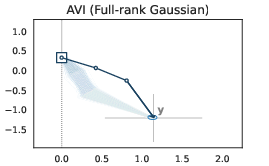

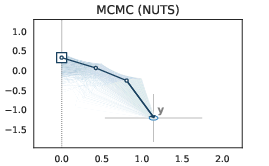

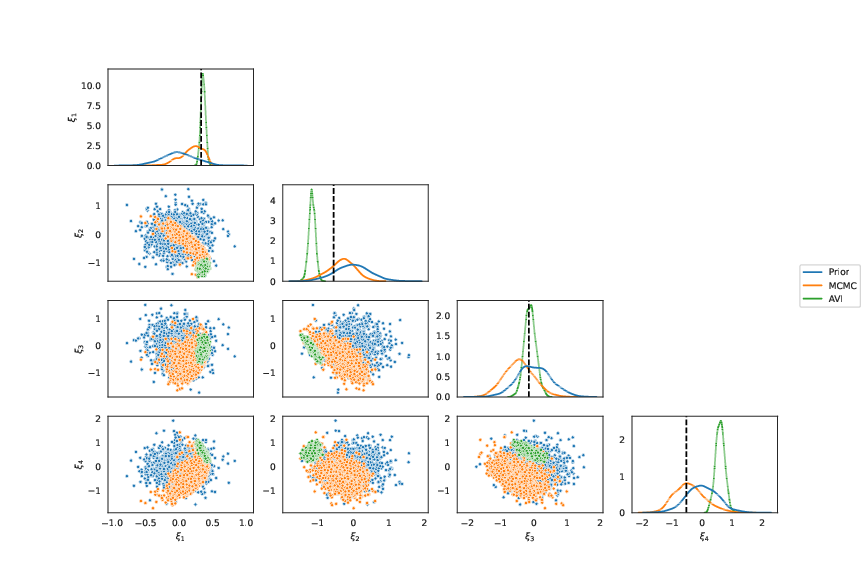

******************************************************************************************
1
Groundtruth:
 xi_data=[[ 0.40310246 -1.0144384   0.02226907  0.14745654]],
 y_data=[[ 1.1857423 -1.193565 ]]


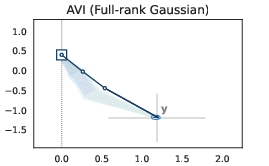

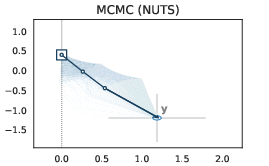

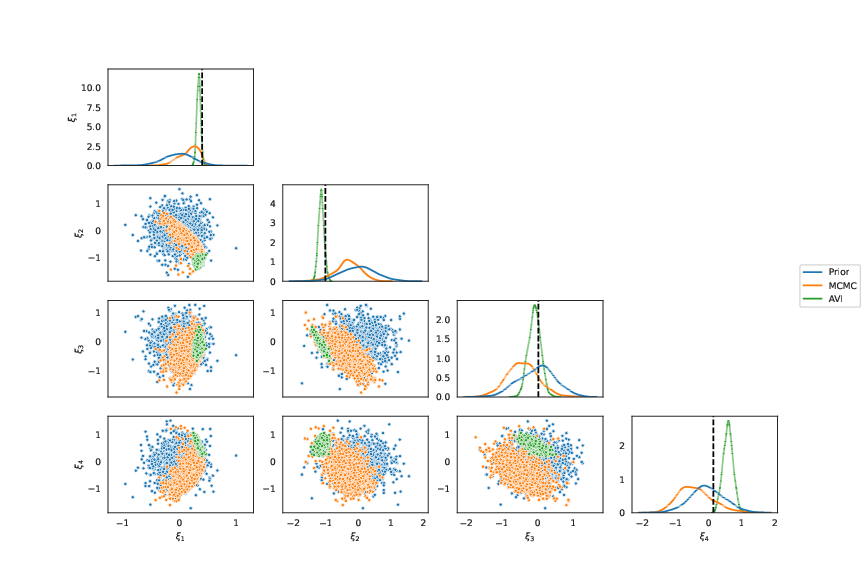

******************************************************************************************
2
Groundtruth:
 xi_data=[[ 0.55319124 -1.0905089   0.18287733 -0.48238057]],
 y_data=[[ 0.7126631 -1.2438035]]


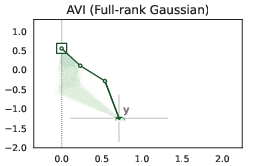

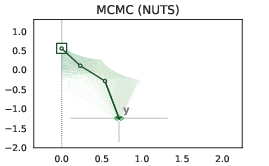

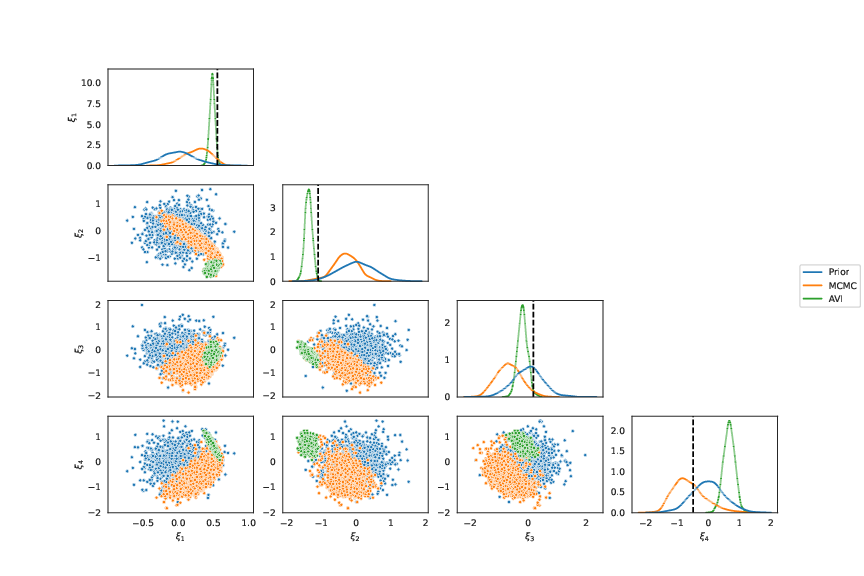

******************************************************************************************
3
Groundtruth:
 xi_data=[[ 0.25331563 -0.46499267 -0.30909264  0.29012063]],
 y_data=[[ 1.682588   -0.76900256]]


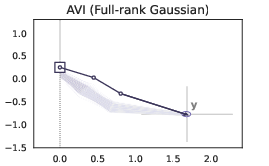

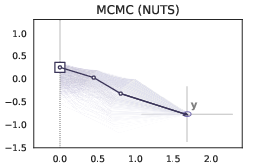

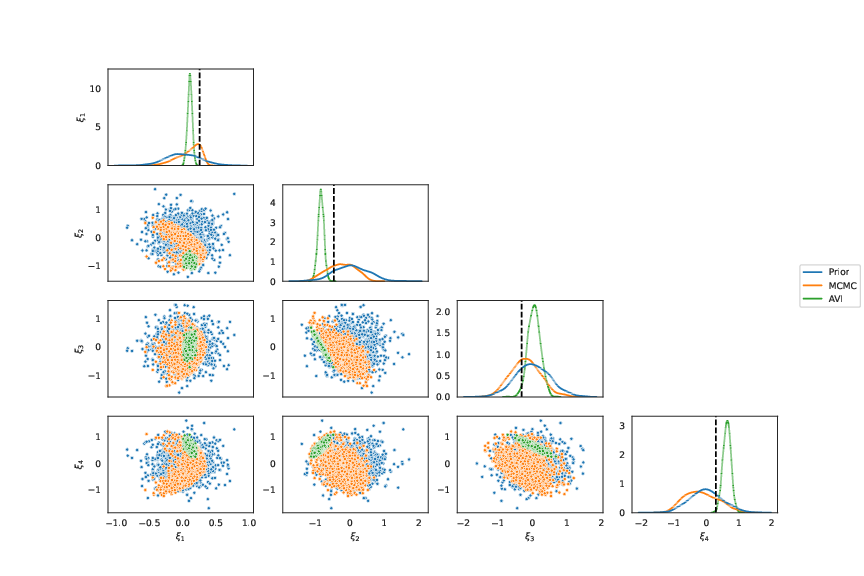

******************************************************************************************
4
Groundtruth:
 xi_data=[[-0.22989541 -0.12536068  0.74884576  0.7099192 ]],
 y_data=[[1.1469465 0.9599577]]


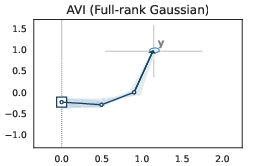

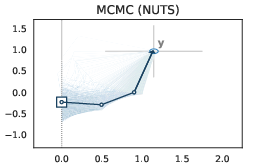

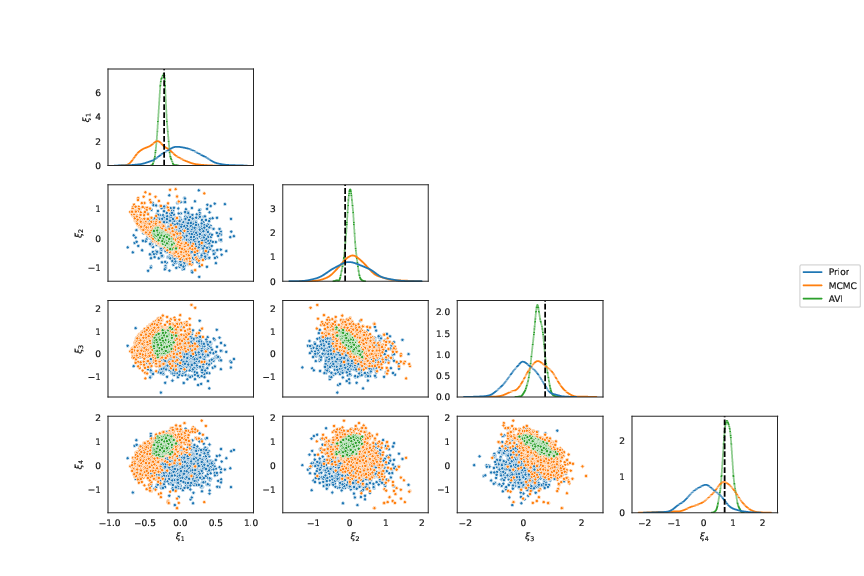

******************************************************************************************
5
Groundtruth:
 xi_data=[[ 0.00948012  0.12390474 -0.4625654   0.5423947 ]],
 y_data=[[1.9545388  0.10864224]]


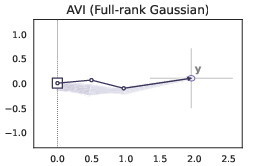

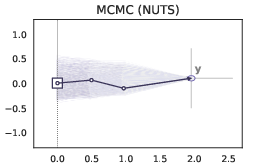

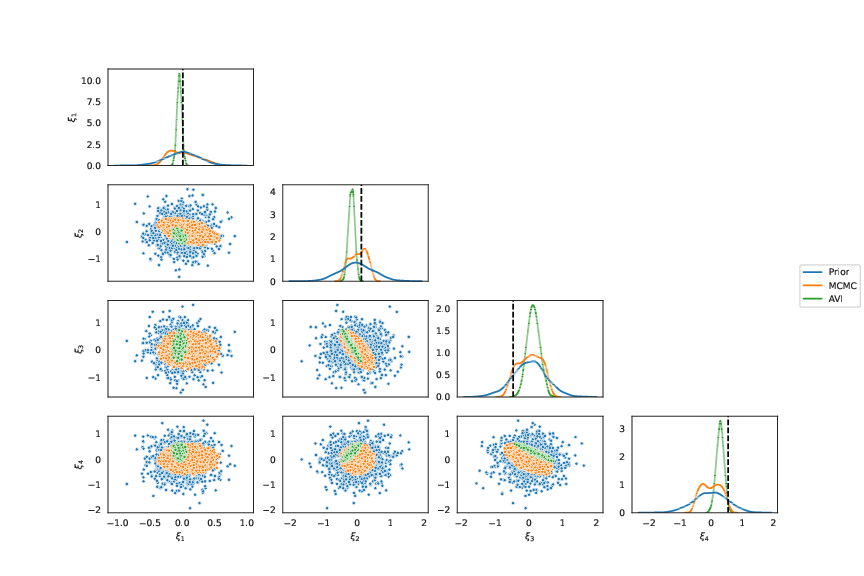

******************************************************************************************
6
Groundtruth:
 xi_data=[[-0.09624812 -0.85516894  0.31634125 -0.05071364]],
 y_data=[[ 1.593624  -1.2729858]]


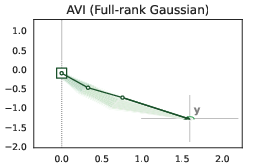

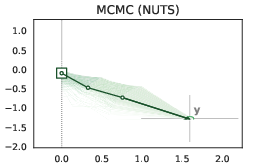

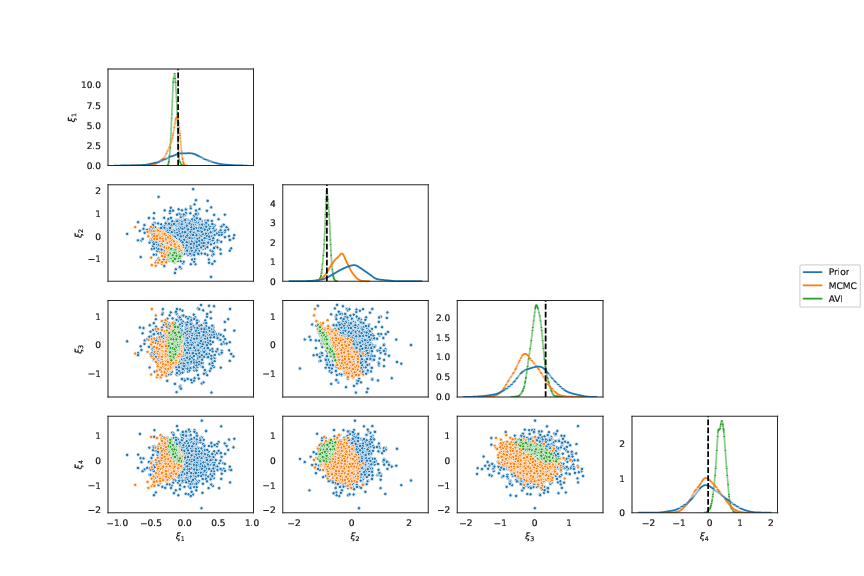

******************************************************************************************
7
Groundtruth:
 xi_data=[[-0.04920331 -0.0157752   0.36060336  0.5166716 ]],
 y_data=[[1.6163418 0.874501 ]]


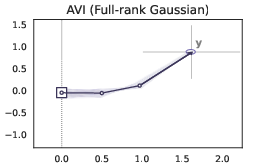

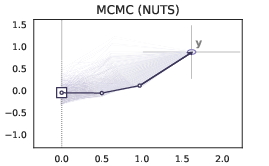

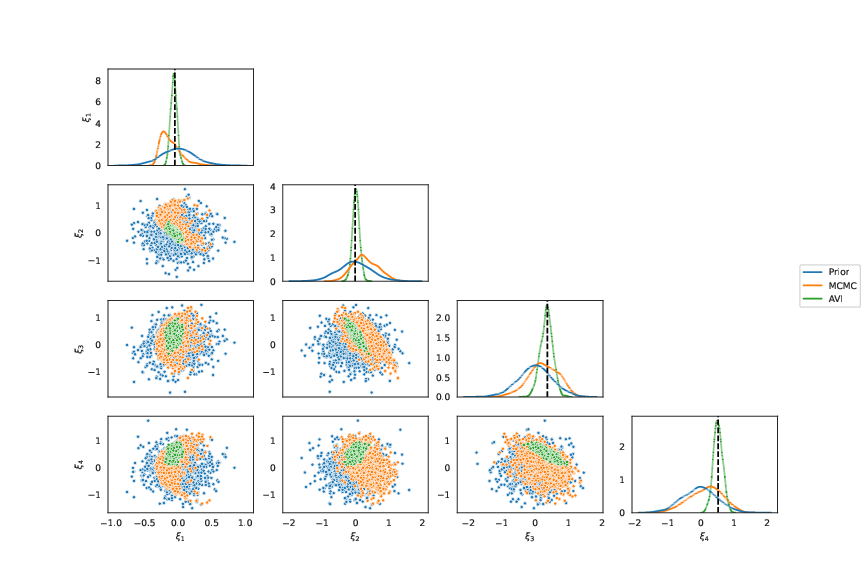

******************************************************************************************
8
Groundtruth:
 xi_data=[[-0.50892717 -0.55879474  0.39216733 -0.24614744]],
 y_data=[[ 1.8308146 -1.2617717]]


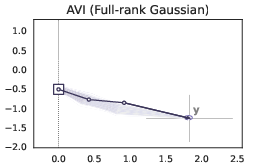

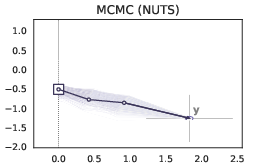

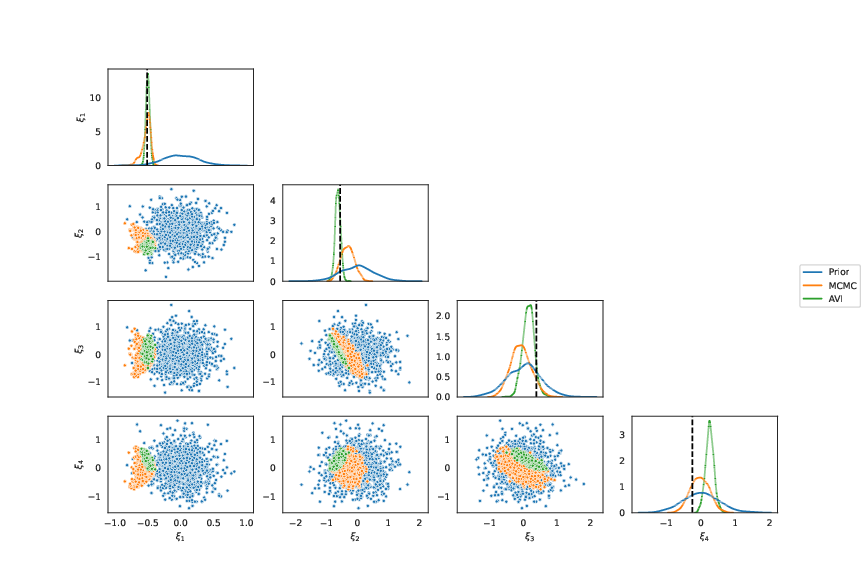

******************************************************************************************
9
Groundtruth:
 xi_data=[[ 0.01783914  0.40772614 -0.1785847   0.02897206]],
 y_data=[[1.9293022 0.5895821]]


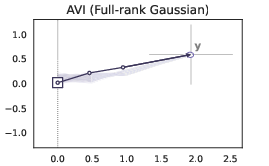

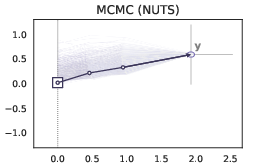

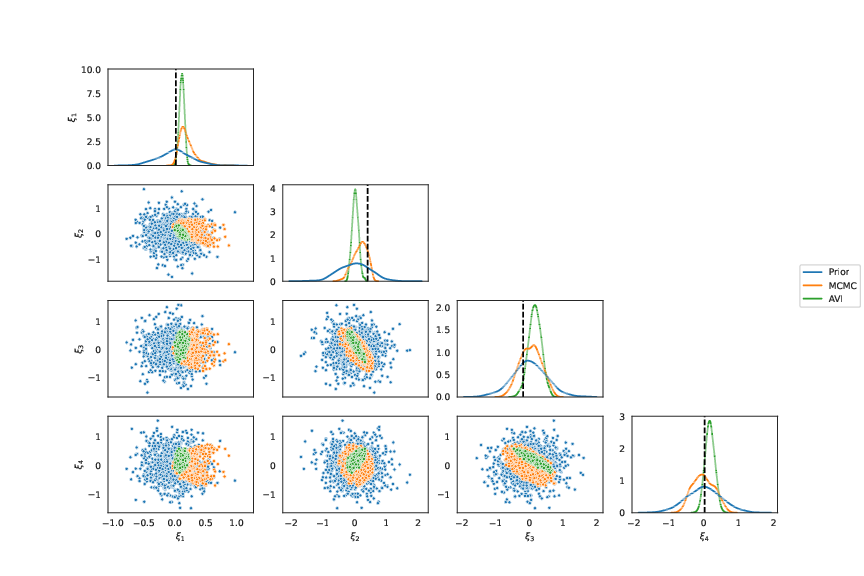

******************************************************************************************
10
Groundtruth:
 xi_data=[[0.11282293 0.24115488 0.21867412 0.24363202]],
 y_data=[[1.6954261 1.113913 ]]


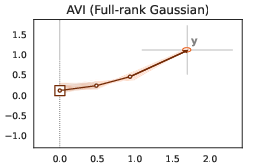

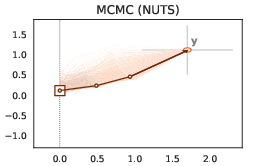

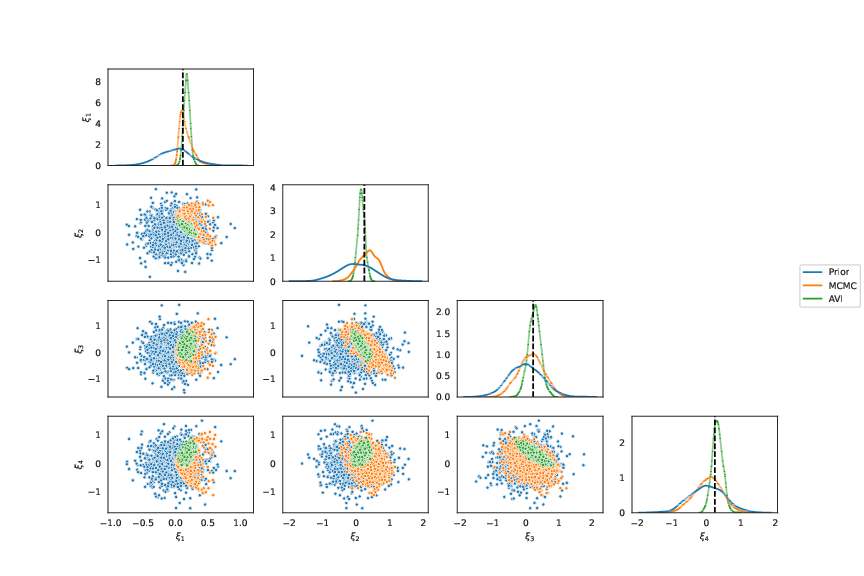

******************************************************************************************
11
Groundtruth:
 xi_data=[[-0.359544    0.24376169  0.18098028 -0.31118906]],
 y_data=[[1.9439929 0.0808953]]


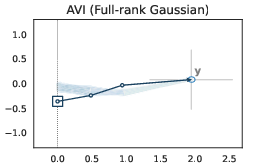

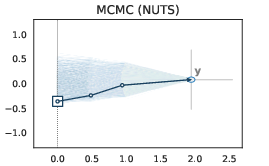

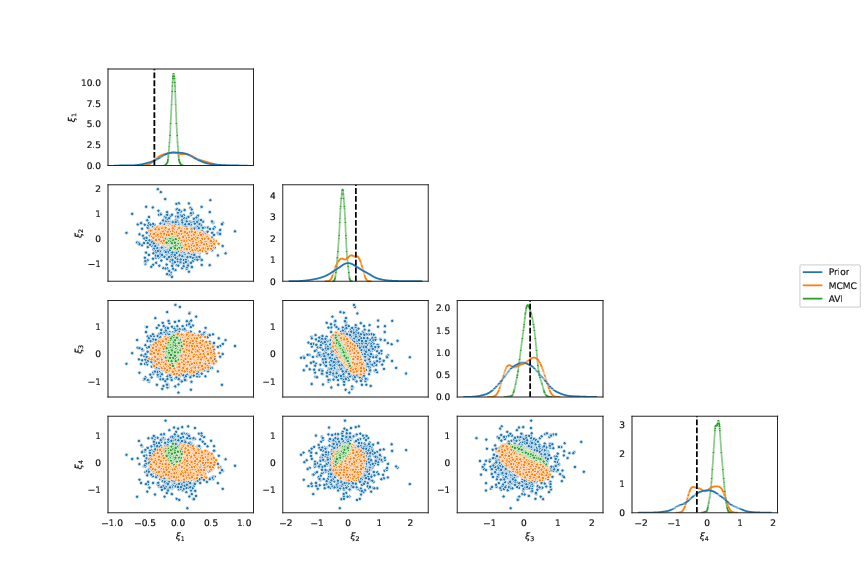

******************************************************************************************
12
Groundtruth:
 xi_data=[[-0.16671292  0.62954605  0.39188838 -0.09713011]],
 y_data=[[1.2755519 1.3534981]]


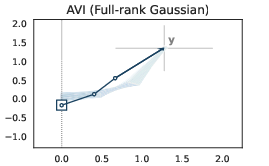

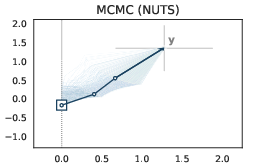

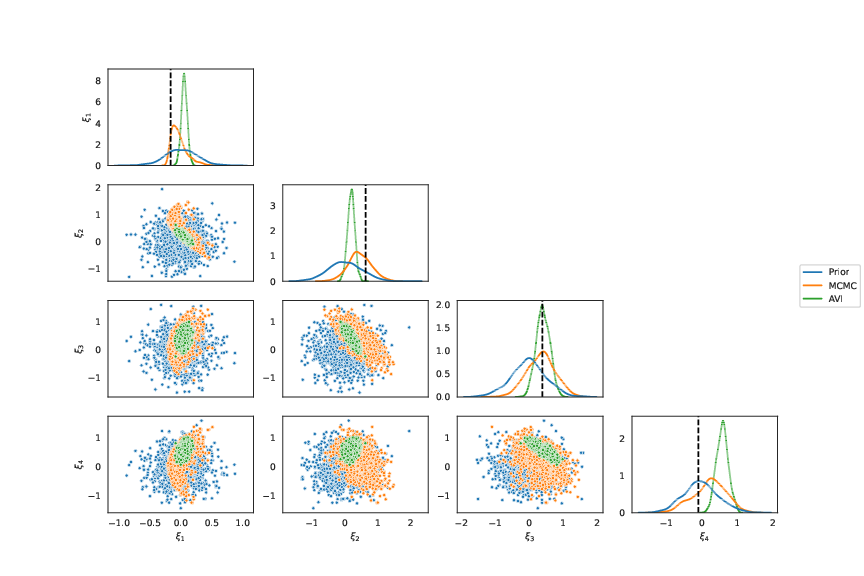

******************************************************************************************
13
Groundtruth:
 xi_data=[[ 0.2636394  -0.38723376 -0.4214368   0.3555074 ]],
 y_data=[[ 1.712288   -0.72933835]]


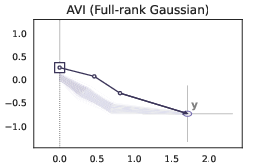

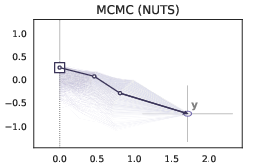

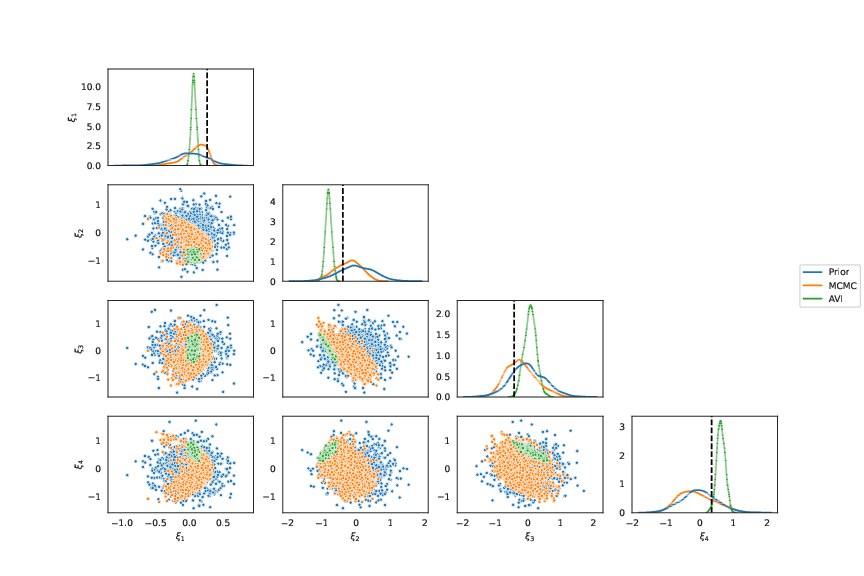

******************************************************************************************
14
Groundtruth:
 xi_data=[[ 0.15583502 -0.37251636 -0.7054376   0.5633536 ]],
 y_data=[[ 1.5609396  -0.94955975]]


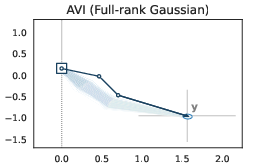

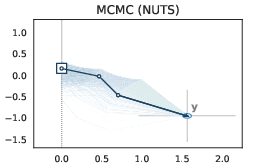

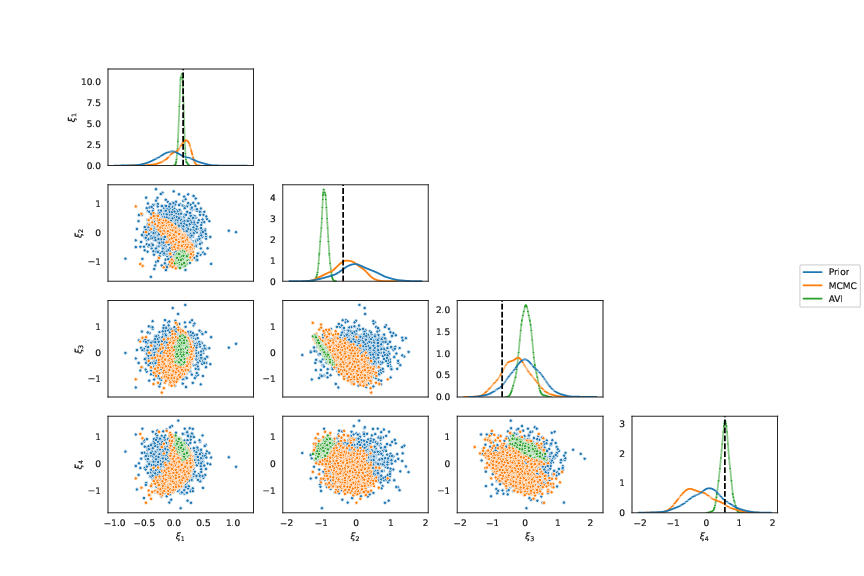

******************************************************************************************
15
Groundtruth:
 xi_data=[[ 0.31505966 -0.07818379  0.28753835  1.0767157 ]],
 y_data=[[1.2689142 1.3261793]]


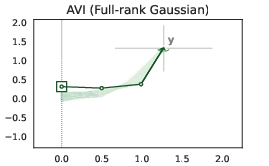

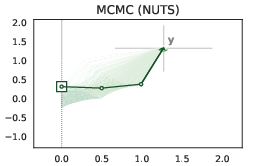

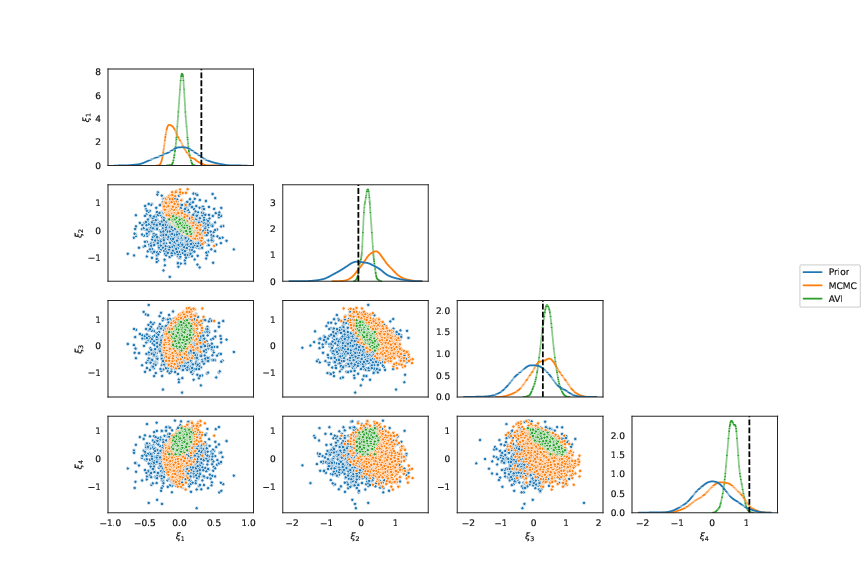

******************************************************************************************
16
Groundtruth:
 xi_data=[[-0.38967395 -0.79756695 -0.5506364   0.72139806]],
 y_data=[[ 1.2731806 -1.81017  ]]


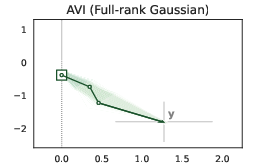

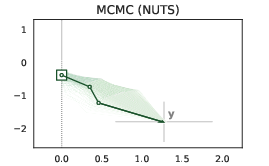

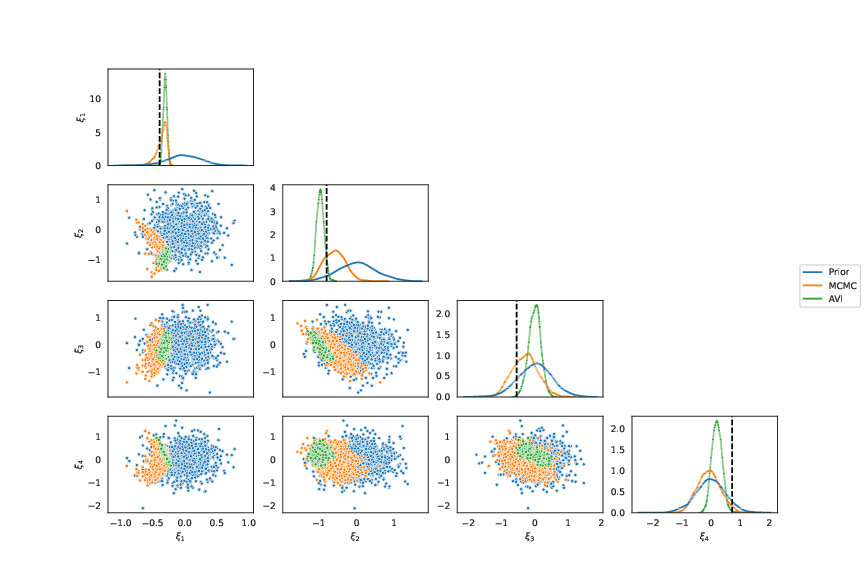

******************************************************************************************
17
Groundtruth:
 xi_data=[[-0.23234537  0.8403019   0.20017883  0.17442149]],
 y_data=[[0.9386571 1.5219055]]


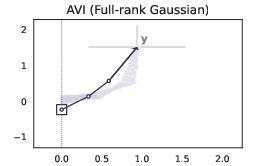

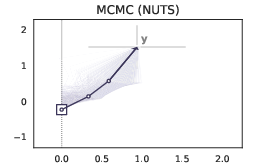

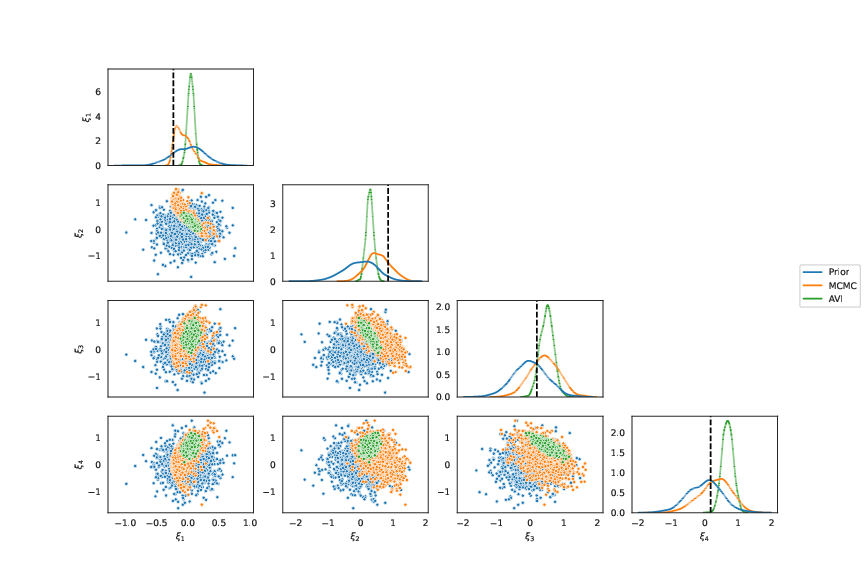

******************************************************************************************
18
Groundtruth:
 xi_data=[[-0.01384143  0.01778083 -0.02025127 -0.5030715 ]],
 y_data=[[ 1.8760271  -0.48981857]]


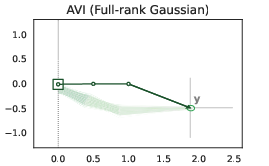

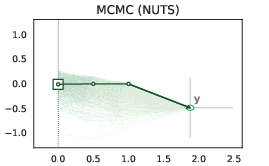

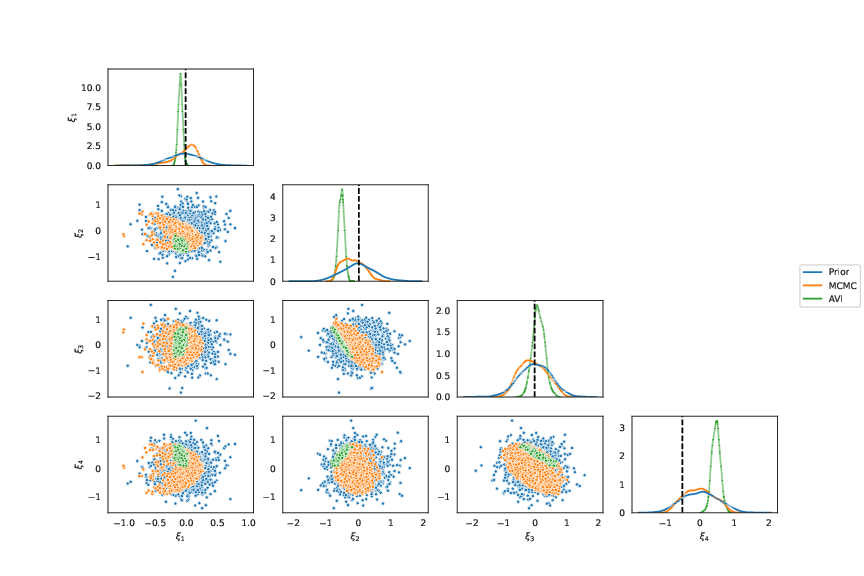

******************************************************************************************
19
Groundtruth:
 xi_data=[[ 0.2206045  -0.12572113 -0.3503949  -0.38868496]],
 y_data=[[ 1.5956581 -0.8293209]]


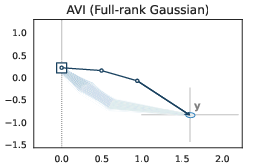

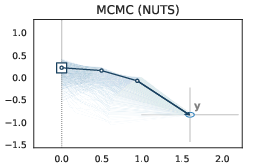

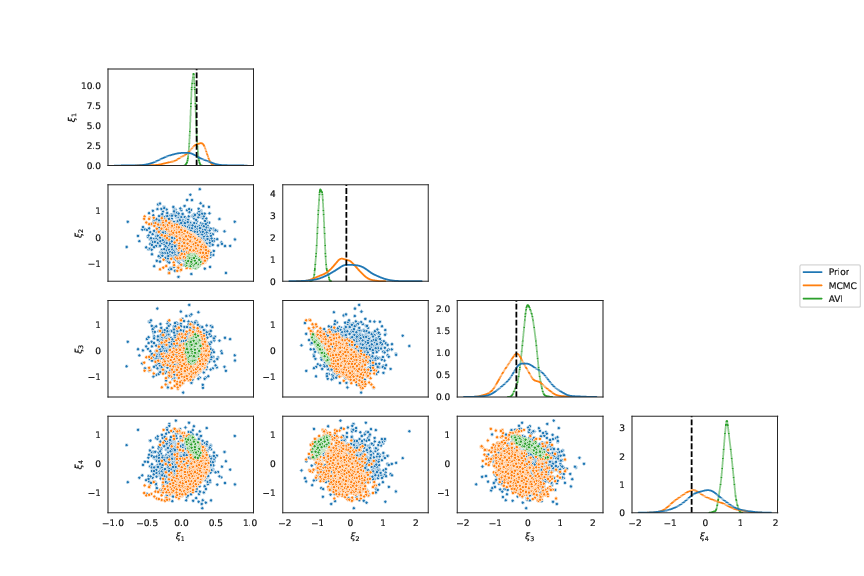

******************************************************************************************
20
Groundtruth:
 xi_data=[[-0.23130952  0.5085948  -0.12110978 -0.16865589]],
 y_data=[[1.8834345 0.4415056]]


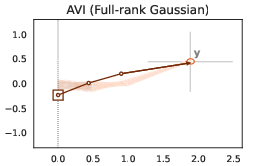

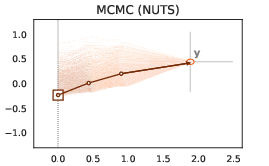

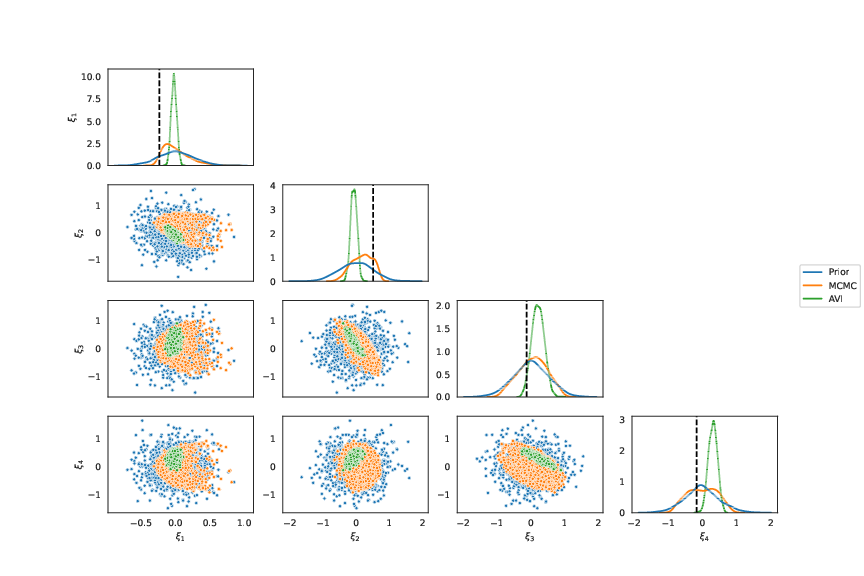

******************************************************************************************
21
Groundtruth:
 xi_data=[[-0.3387181  -0.34042588 -0.25576296  0.7965104 ]],
 y_data=[[ 1.8530823  -0.59454316]]


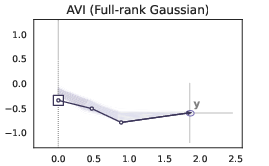

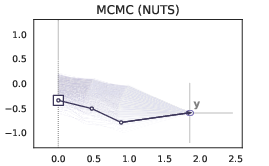

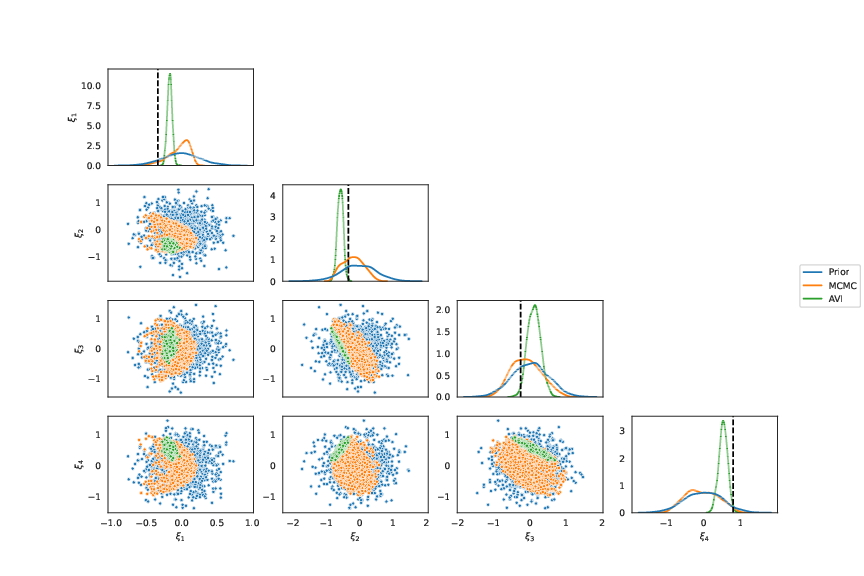

******************************************************************************************
22
Groundtruth:
 xi_data=[[-0.08510591 -0.2509109   0.24188042 -0.26760364]],
 y_data=[[ 1.9401046 -0.4681557]]


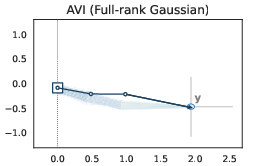

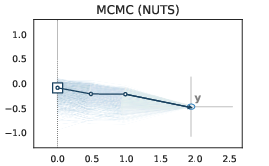

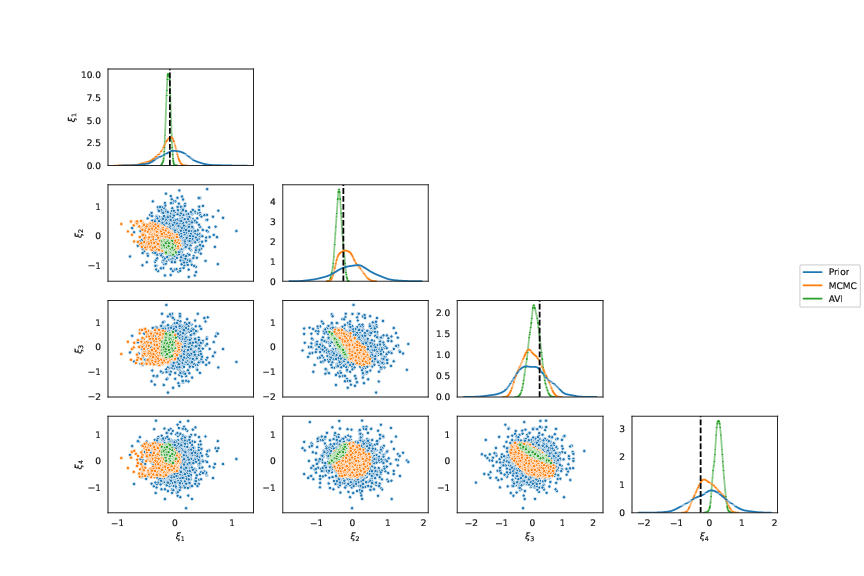

******************************************************************************************
23
Groundtruth:
 xi_data=[[ 0.13217601 -0.00775406 -0.28050897  0.5870508 ]],
 y_data=[[1.9246879 0.2893941]]


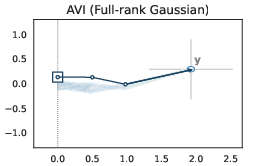

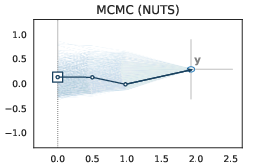

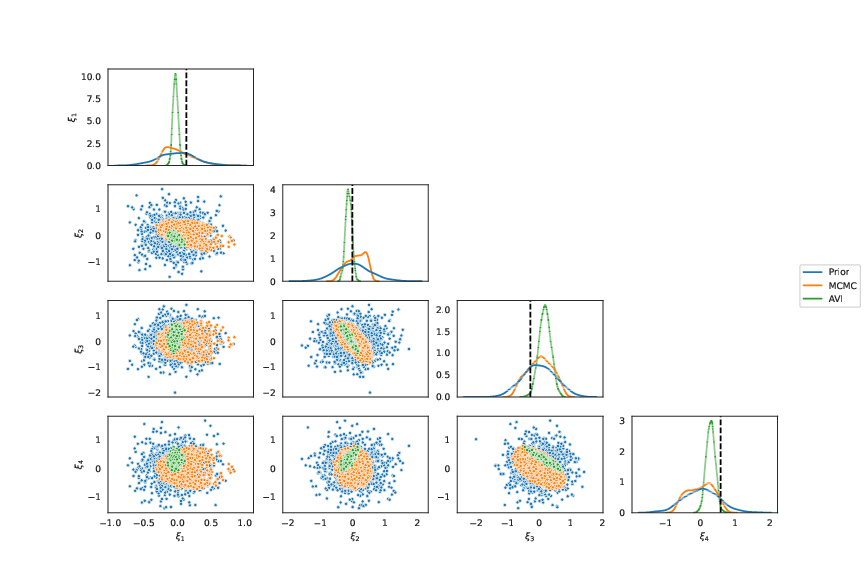

******************************************************************************************
24
Groundtruth:
 xi_data=[[-0.38006404  0.27656513  0.3998013   0.38692766]],
 y_data=[[1.377713 0.92463 ]]


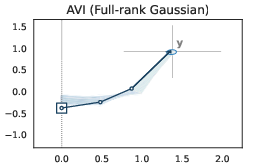

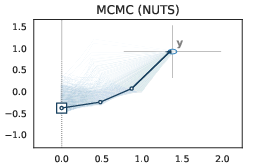

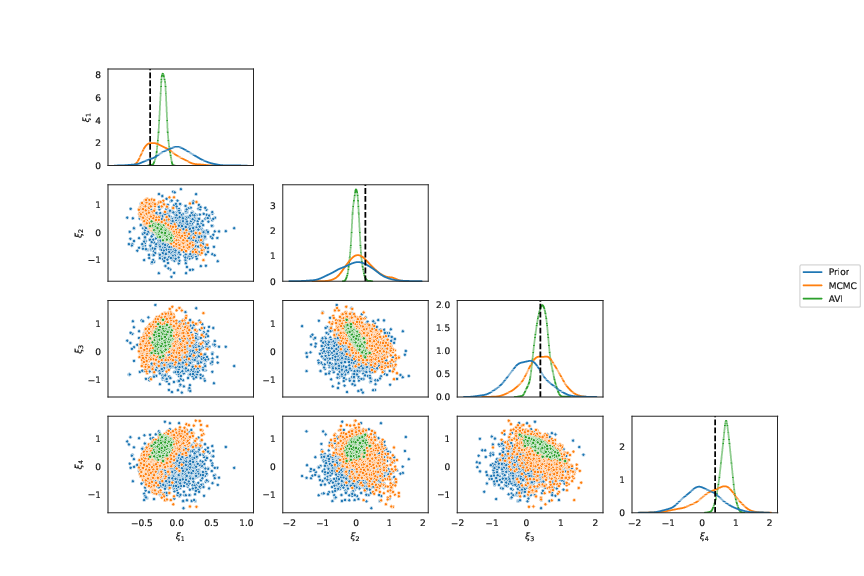

******************************************************************************************
25
Groundtruth:
 xi_data=[[ 0.12021104 -1.5415511   0.18567094 -0.0108258 ]],
 y_data=[[ 0.33683357 -1.8471528 ]]


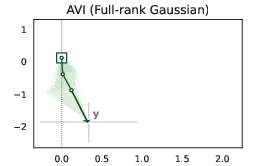

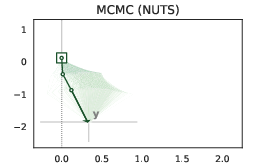

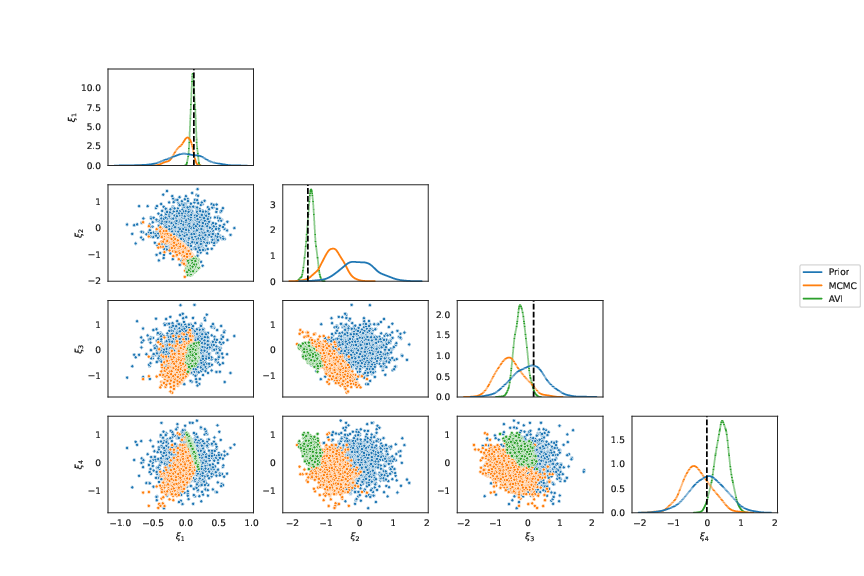

******************************************************************************************
26
Groundtruth:
 xi_data=[[ 0.04899888 -0.12940374  0.7096278   0.90806454]],
 y_data=[[0.9974265 1.261508 ]]


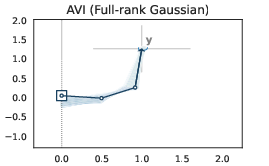

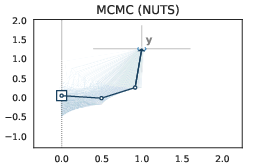

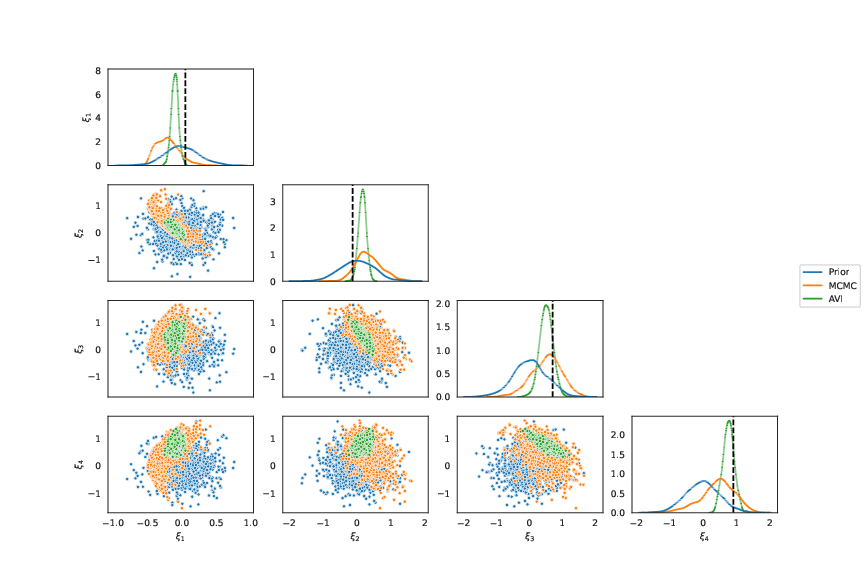

******************************************************************************************
27
Groundtruth:
 xi_data=[[ 0.25410953 -0.04562116  0.1716034  -0.4587445 ]],
 y_data=[[ 1.9301497  -0.02449554]]


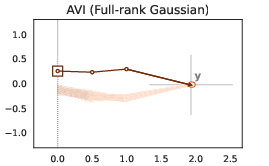

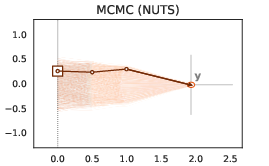

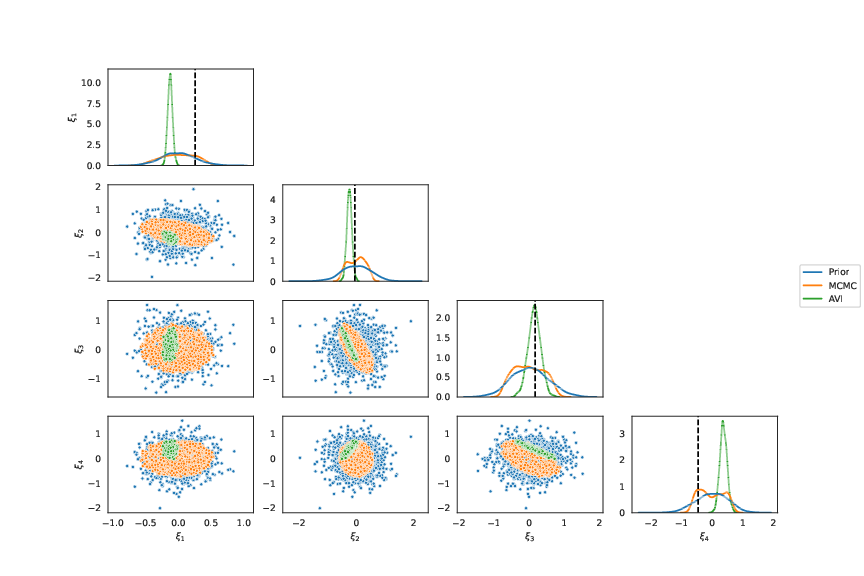

******************************************************************************************
28
Groundtruth:
 xi_data=[[-0.17085701  0.04870587 -0.06825739  0.08976489]],
 y_data=[[ 2.0122764 -0.0863356]]


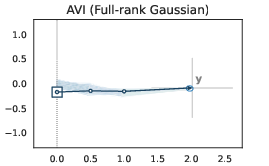

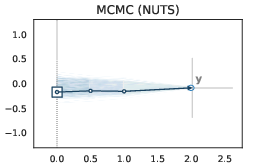

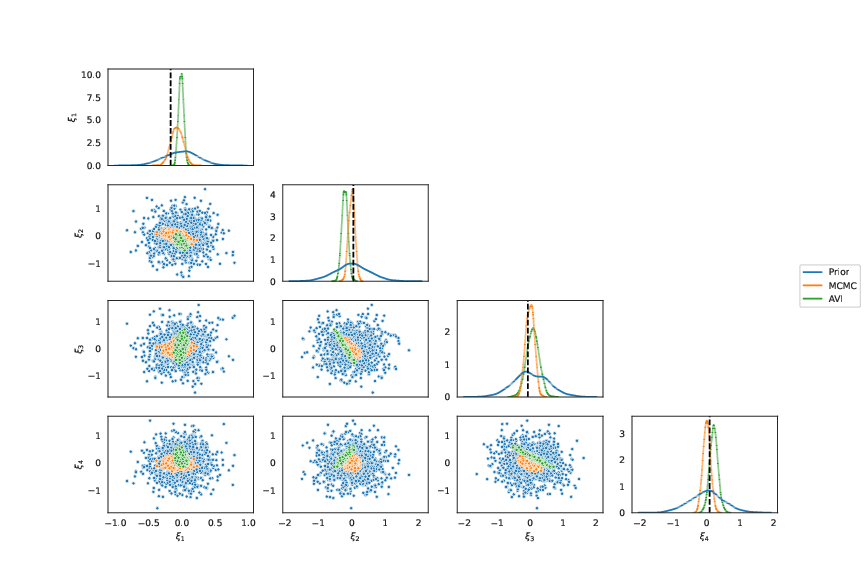

******************************************************************************************
29
Groundtruth:
 xi_data=[[ 0.13998315 -0.23427562  0.10675078 -0.9155886 ]],
 y_data=[[ 1.4826602 -0.9077633]]


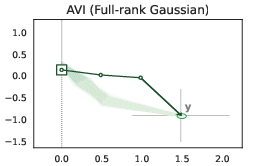

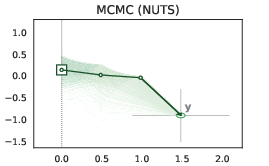

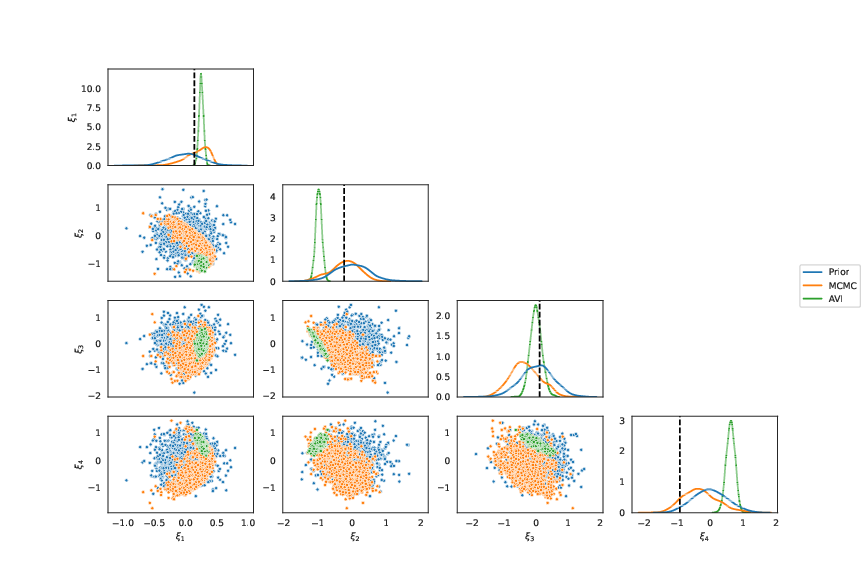

******************************************************************************************
30
Groundtruth:
 xi_data=[[ 0.07322151 -0.12848109 -0.4071268   0.5861429 ]],
 y_data=[[ 1.92636    -0.18569945]]


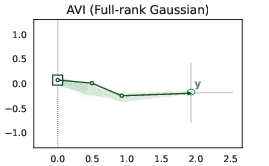

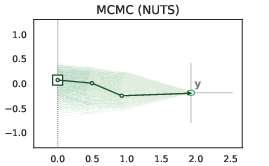

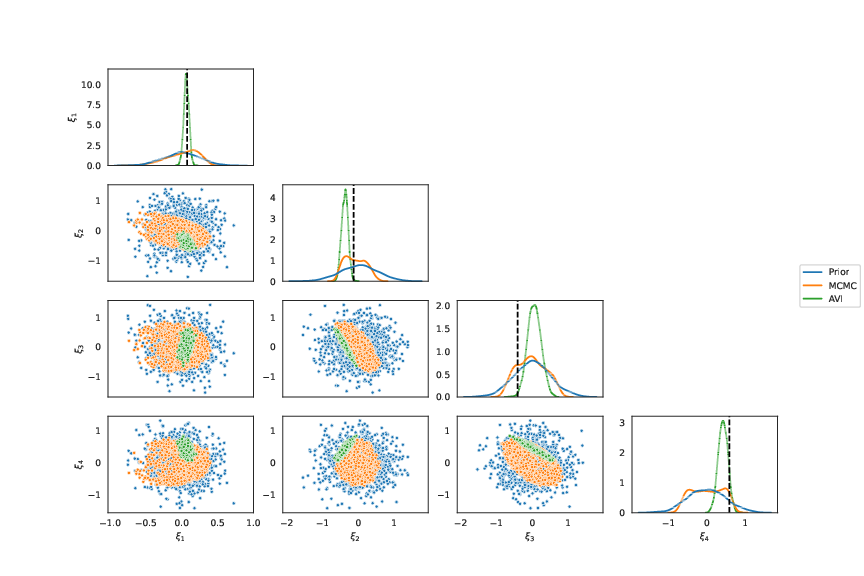

******************************************************************************************
31
Groundtruth:
 xi_data=[[-0.09788683 -0.7469084   0.3330001  -0.22069731]],
 y_data=[[ 1.6518085 -1.2300087]]


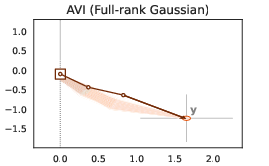

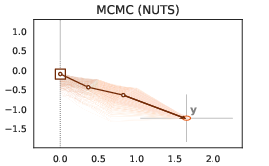

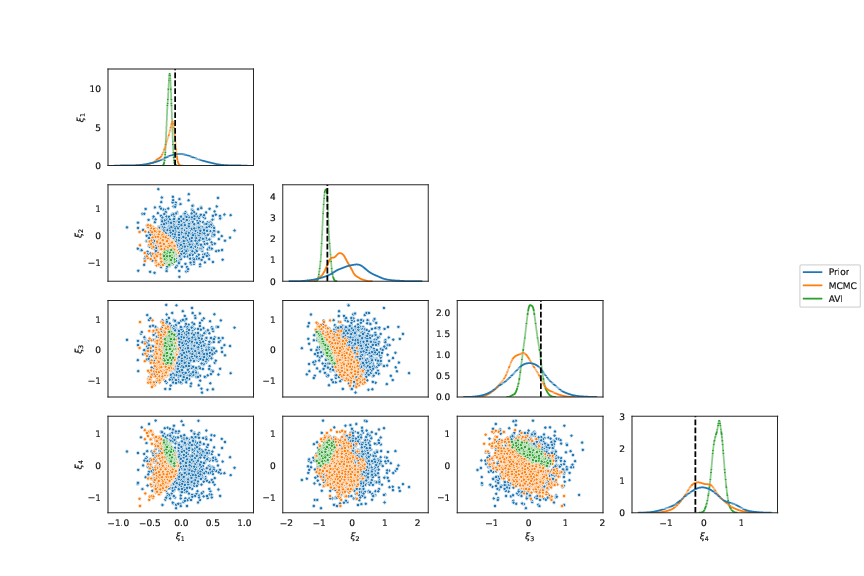

******************************************************************************************
32
Groundtruth:
 xi_data=[[0.17567904 0.2030463  0.0075309  0.70594907]],
 y_data=[[1.5916654 1.1670499]]


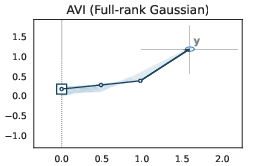

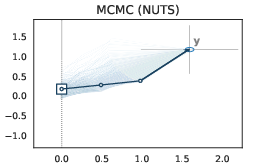

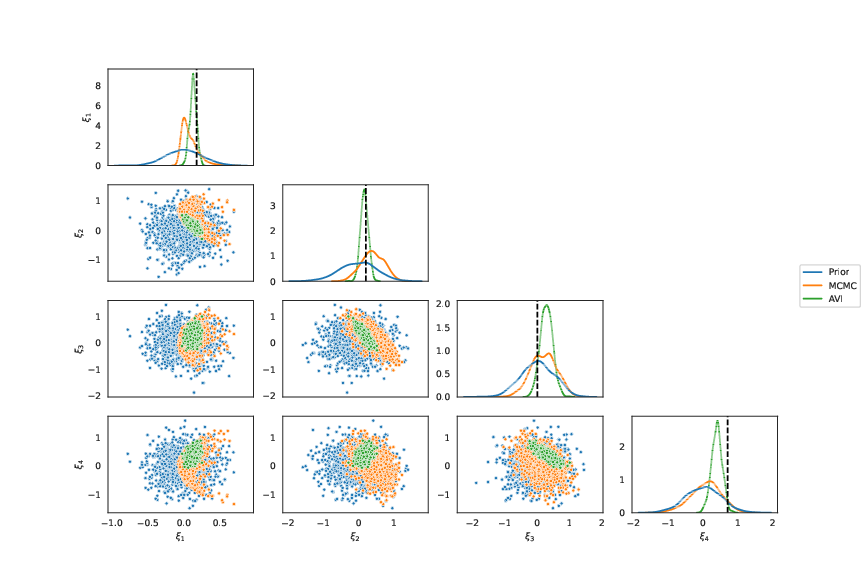

******************************************************************************************
33
Groundtruth:
 xi_data=[[-0.04451474 -0.52385736  0.3054874  -0.9971843 ]],
 y_data=[[ 1.2819277 -1.3493776]]


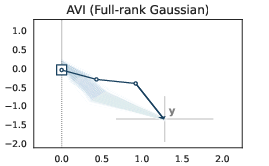

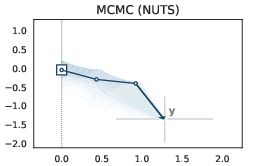

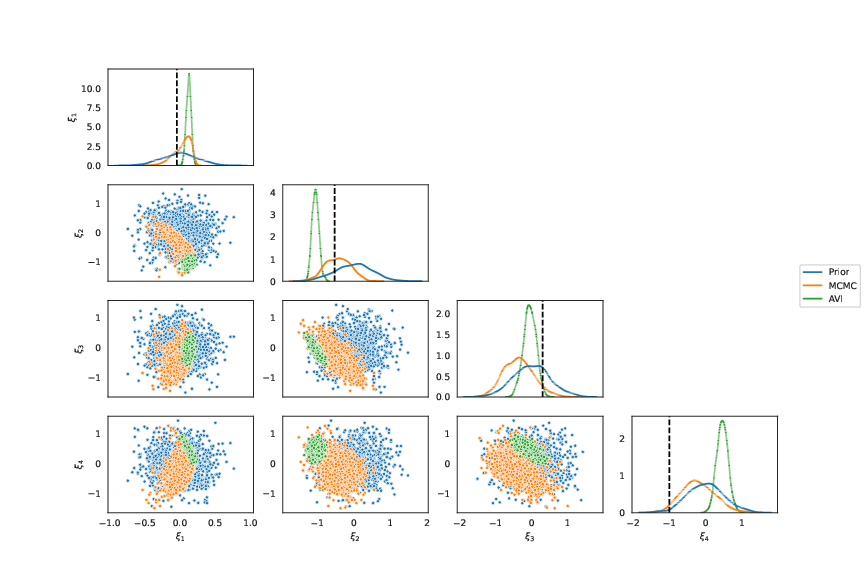

******************************************************************************************
34
Groundtruth:
 xi_data=[[-0.4595037  -0.4715329  -0.28616634 -0.43546456]],
 y_data=[[ 1.1883012 -1.9501187]]


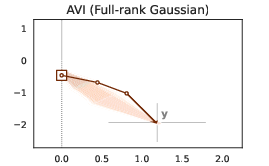

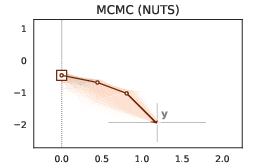

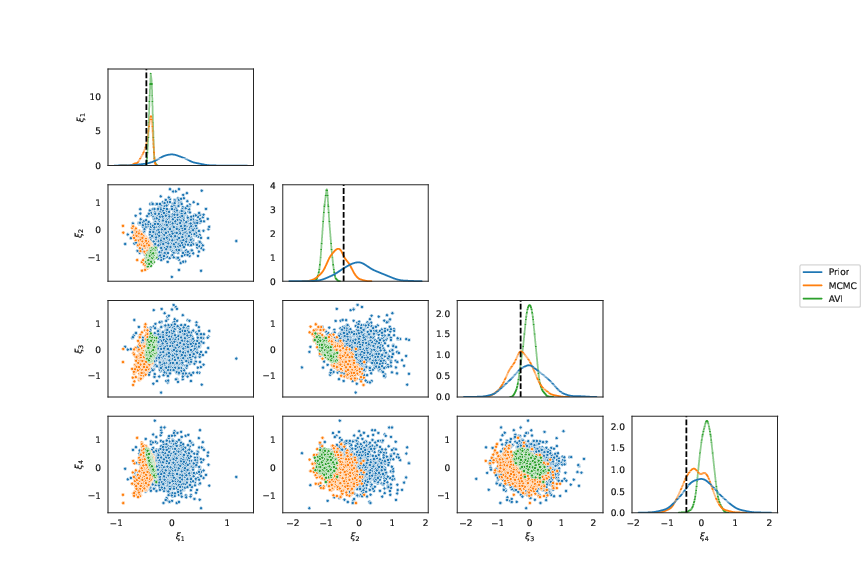

******************************************************************************************
35
Groundtruth:
 xi_data=[[-0.24795708 -0.51349944 -0.7422401   0.00579863]],
 y_data=[[ 0.90447974 -1.920153  ]]


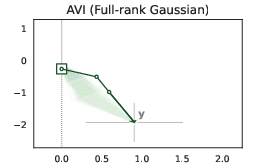

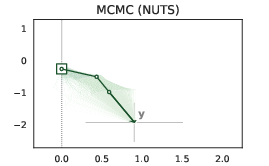

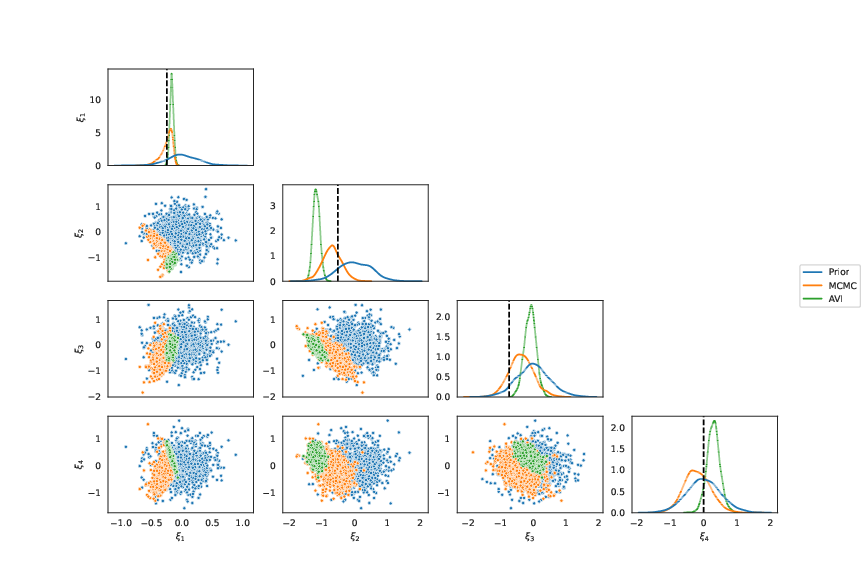

******************************************************************************************
36
Groundtruth:
 xi_data=[[ 0.3354301   0.8815546  -0.20953648 -0.42672086]],
 y_data=[[1.6731473 1.2900836]]


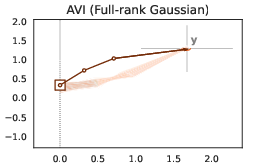

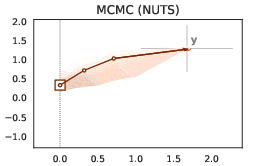

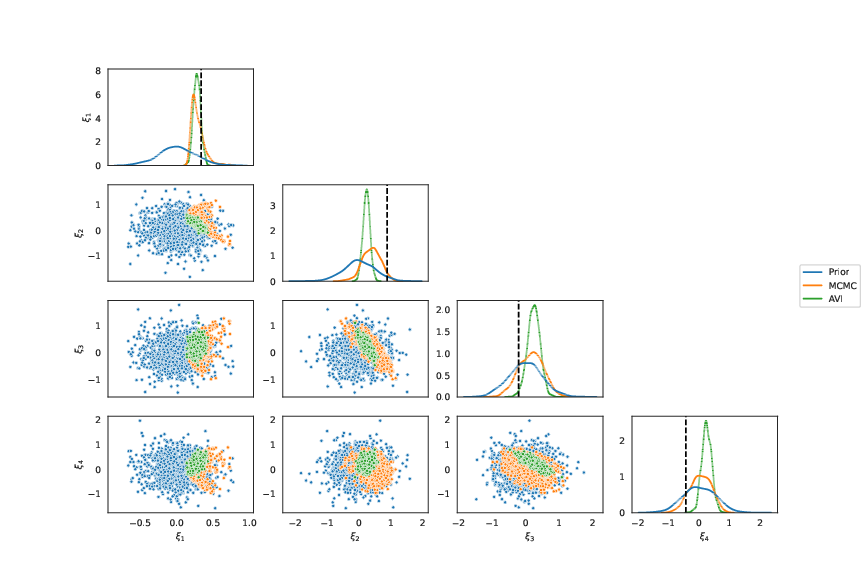

******************************************************************************************
37
Groundtruth:
 xi_data=[[ 0.3986427  -0.19970879  0.3398172   0.16794676]],
 y_data=[[1.9434476 0.6834412]]


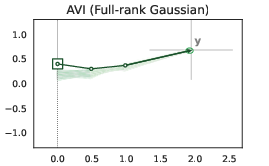

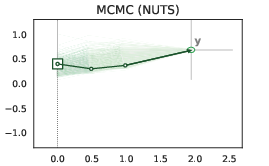

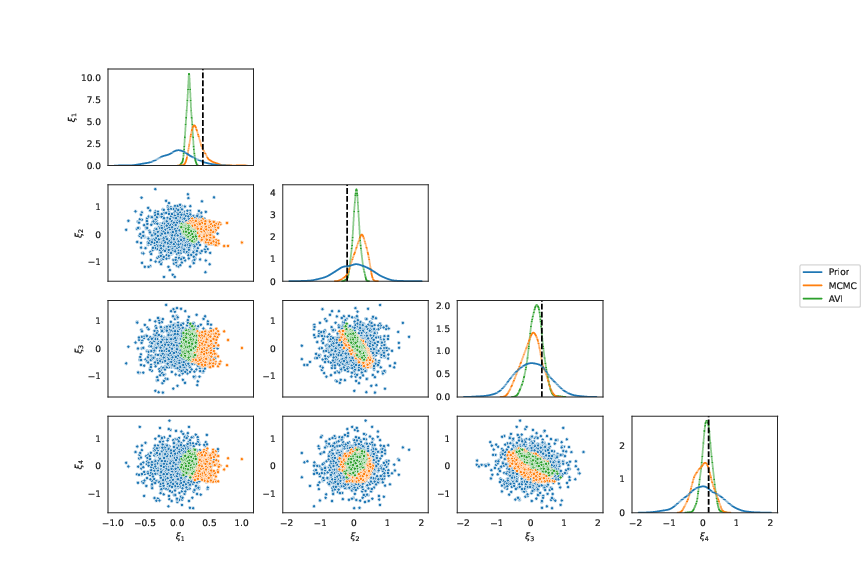

******************************************************************************************
38
Groundtruth:
 xi_data=[[-0.17849228  0.38805047  0.2807577  -0.5846471 ]],
 y_data=[[1.8345138  0.40912378]]


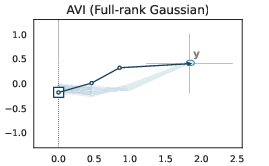

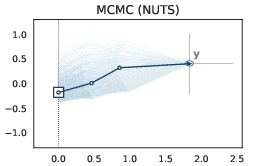

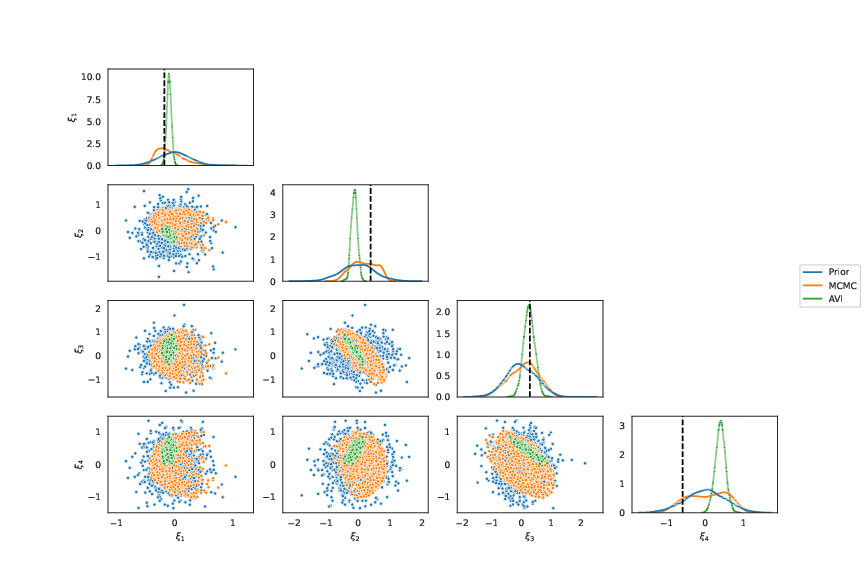

******************************************************************************************
39
Groundtruth:
 xi_data=[[-0.34218127  0.33308136 -0.69580823 -0.1865357 ]],
 y_data=[[ 1.7862636 -0.8883599]]


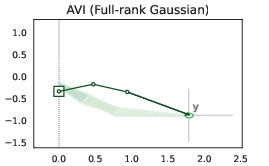

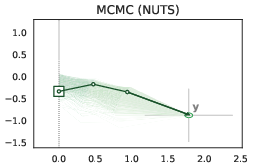

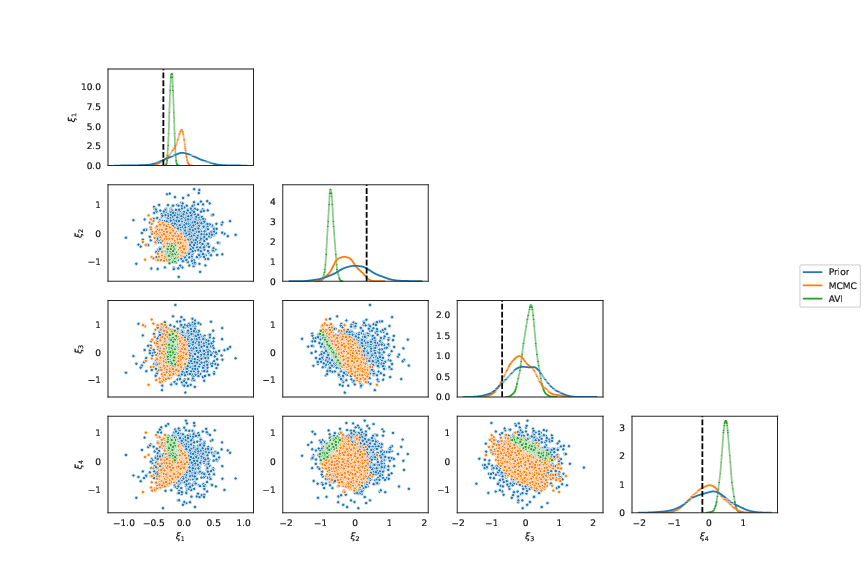

******************************************************************************************
40
Groundtruth:
 xi_data=[[ 0.00397701  0.68952274 -0.74524194 -1.0329746 ]],
 y_data=[[ 1.3498209  -0.59431684]]


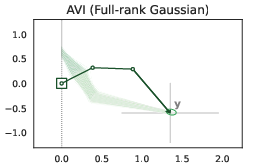

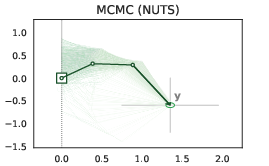

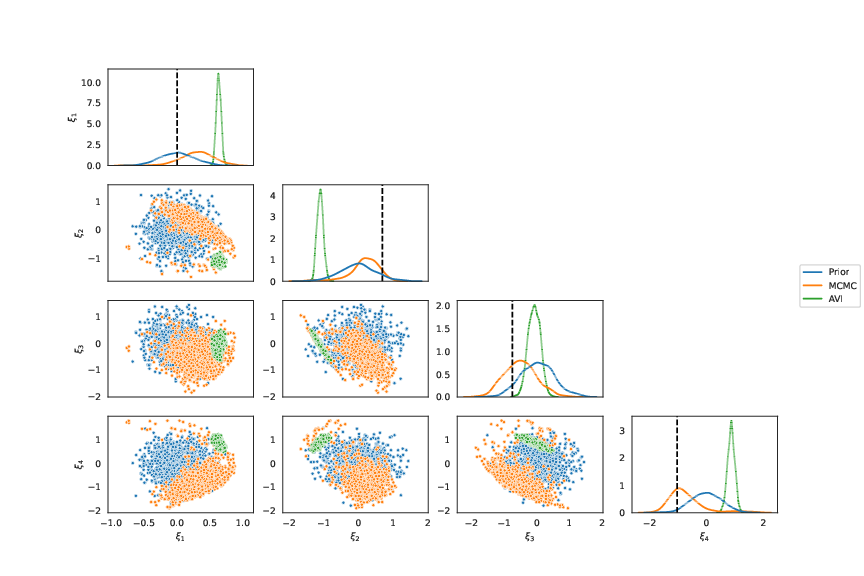

******************************************************************************************
41
Groundtruth:
 xi_data=[[ 0.2092986   0.10306658  0.20991409 -0.55388606]],
 y_data=[[1.9428687  0.16411604]]


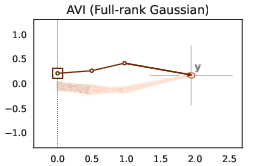

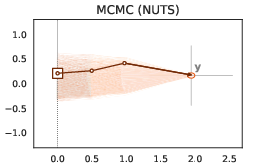

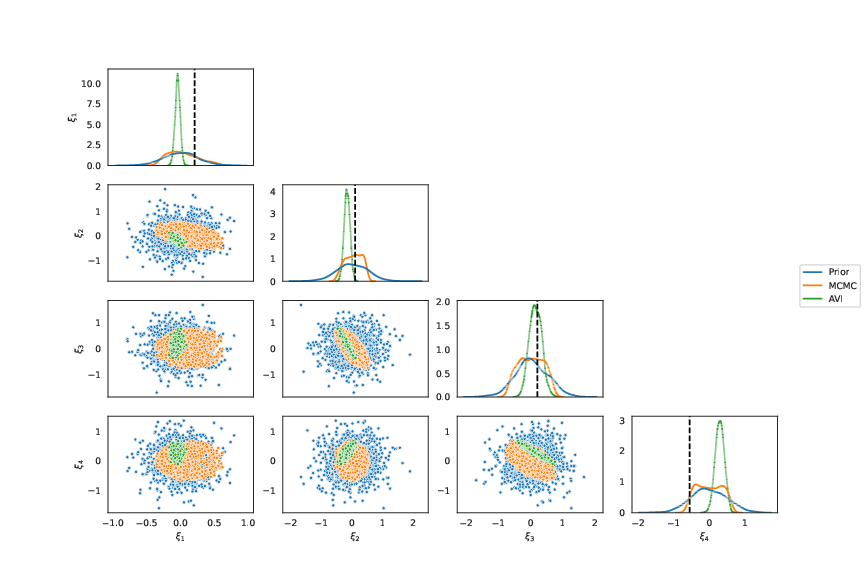

******************************************************************************************
42
Groundtruth:
 xi_data=[[ 0.03035832 -1.0021539  -0.47369176  1.0493953 ]],
 y_data=[[ 1.2359804 -1.3066015]]


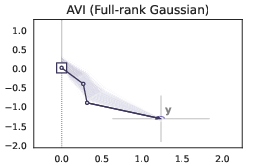

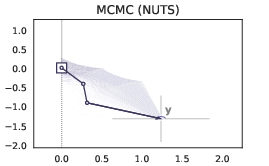

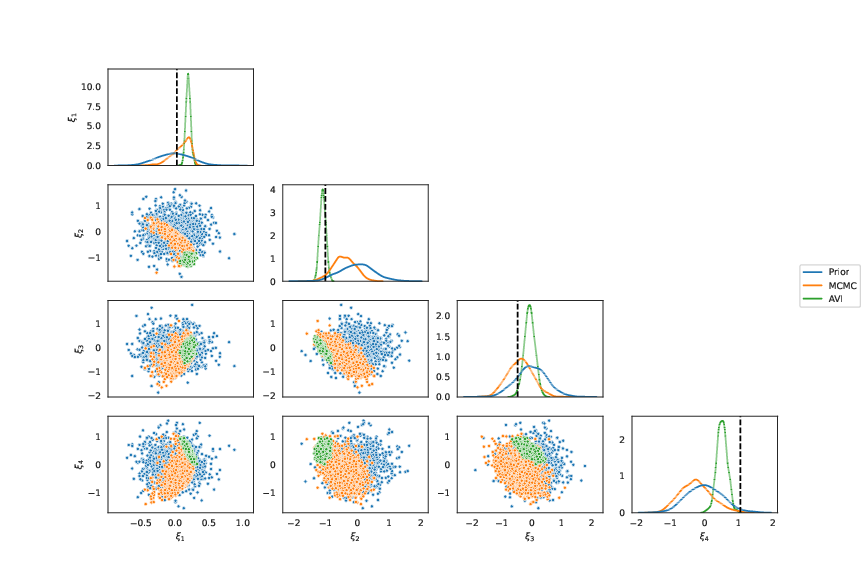

******************************************************************************************
43
Groundtruth:
 xi_data=[[-0.15895543  0.40347072 -0.1808932  -0.62202305]],
 y_data=[[ 1.8486401  -0.24350233]]


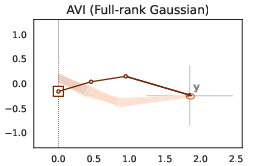

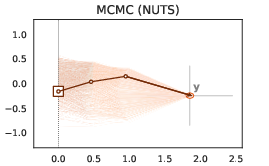

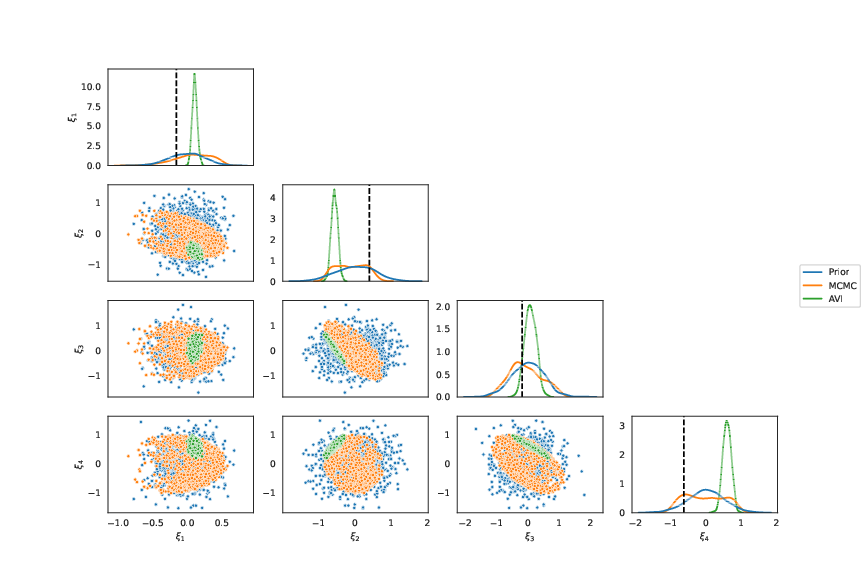

******************************************************************************************
44
Groundtruth:
 xi_data=[[-0.12099919 -0.52264124 -0.9628984   0.295593  ]],
 y_data=[[ 0.84633464 -1.7888743 ]]


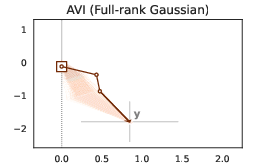

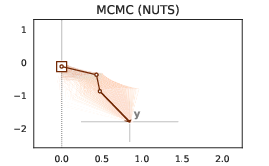

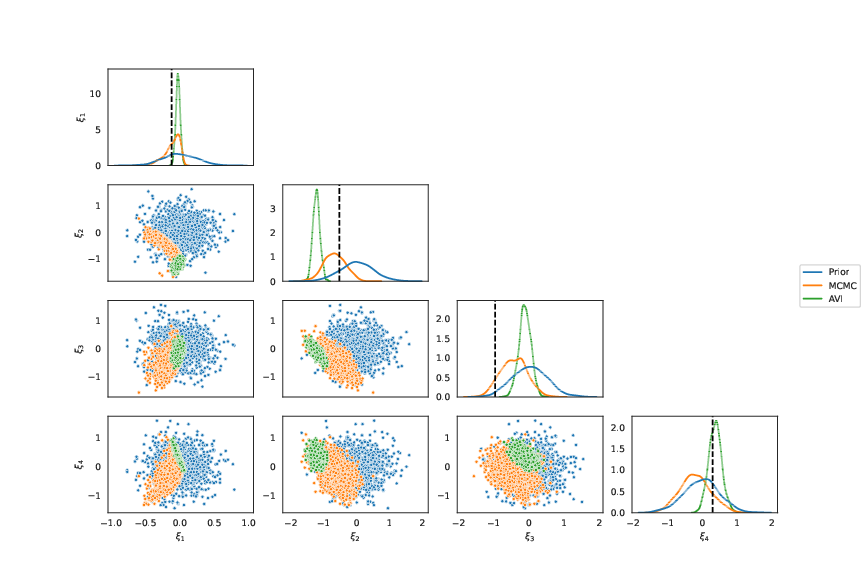

******************************************************************************************
45
Groundtruth:
 xi_data=[[ 0.09888019  0.36916757 -0.7138308   0.8789521 ]],
 y_data=[[1.8188113 0.6116646]]


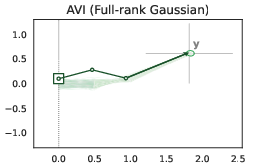

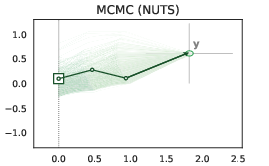

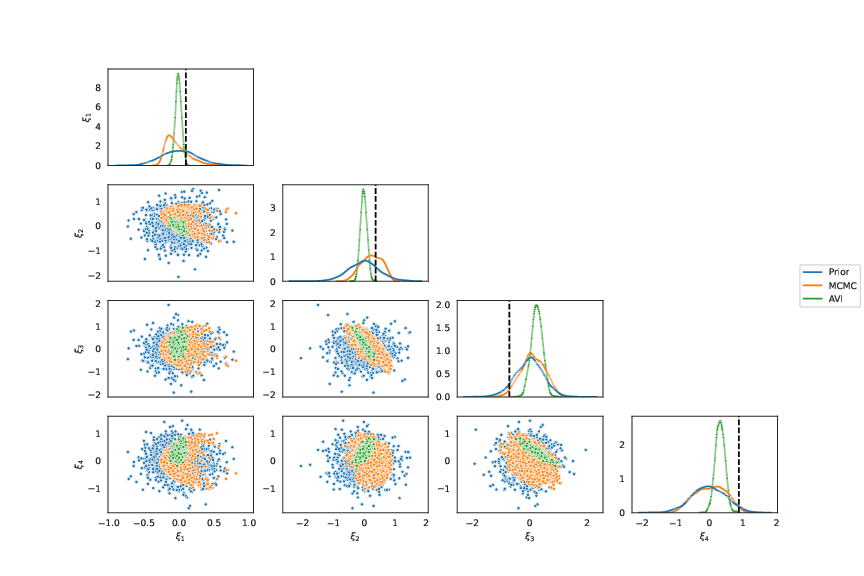

******************************************************************************************
46
Groundtruth:
 xi_data=[[ 0.23378192 -0.36403707 -0.7256669   0.02653996]],
 y_data=[[ 1.1840973 -1.2596731]]


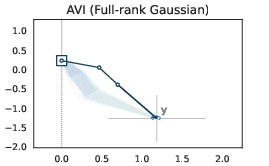

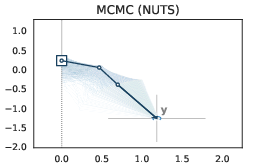

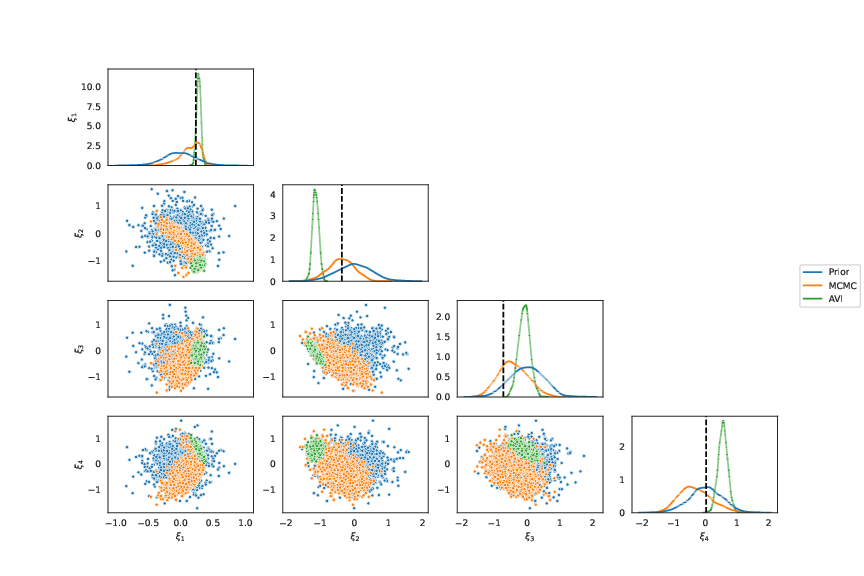

******************************************************************************************
47
Groundtruth:
 xi_data=[[-0.18615687  0.0612733  -0.3292502   0.7203397 ]],
 y_data=[[1.8799518  0.16143826]]


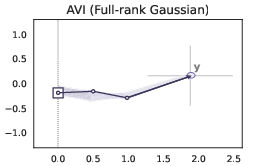

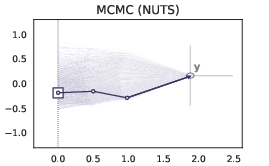

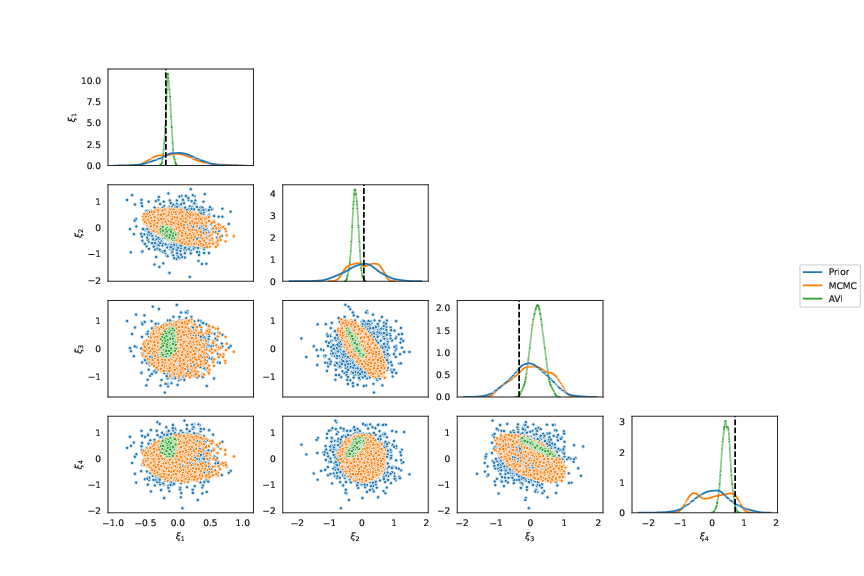

******************************************************************************************
48
Groundtruth:
 xi_data=[[-0.10950767  0.6952659  -0.21689452  0.49412647]],
 y_data=[[1.3972718 1.2621155]]


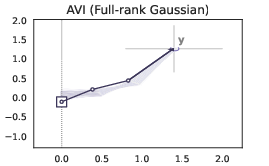

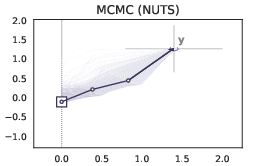

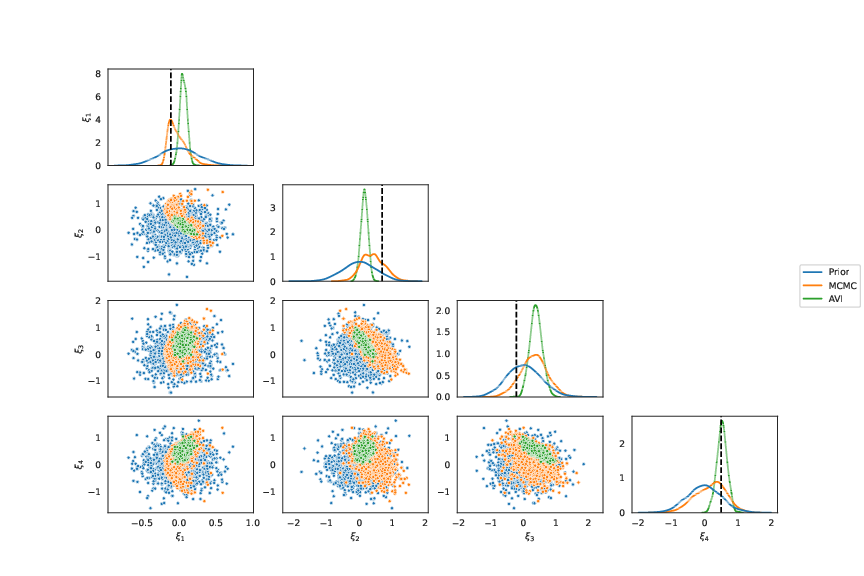

******************************************************************************************
49
Groundtruth:
 xi_data=[[-0.04462509 -0.15386339  0.12801227 -0.54583436]],
 y_data=[[ 1.8372629  -0.67524093]]


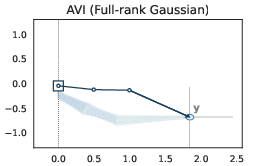

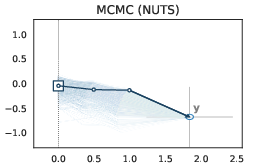

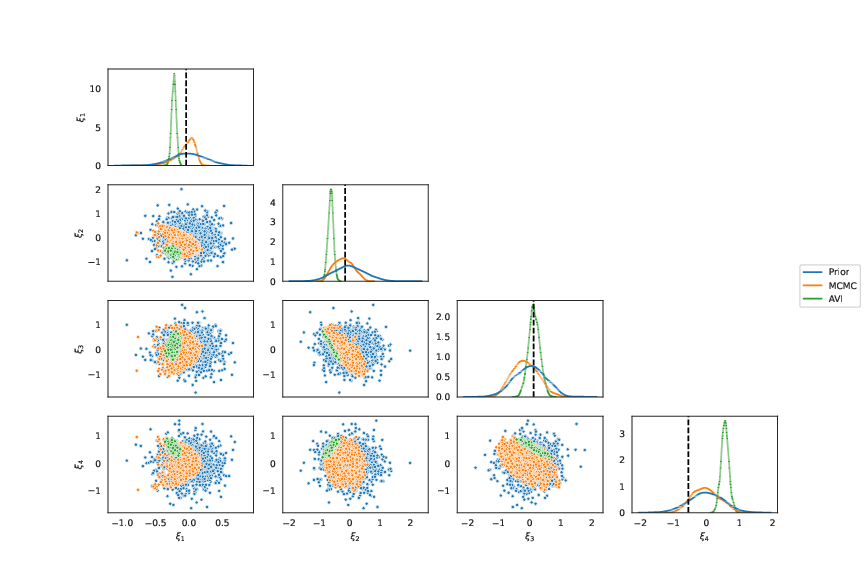

******************************************************************************************
50
Groundtruth:
 xi_data=[[-0.18497033 -0.3959051   1.0225197  -0.3266425 ]],
 y_data=[[1.8307894  0.19374189]]


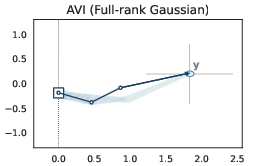

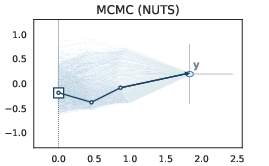

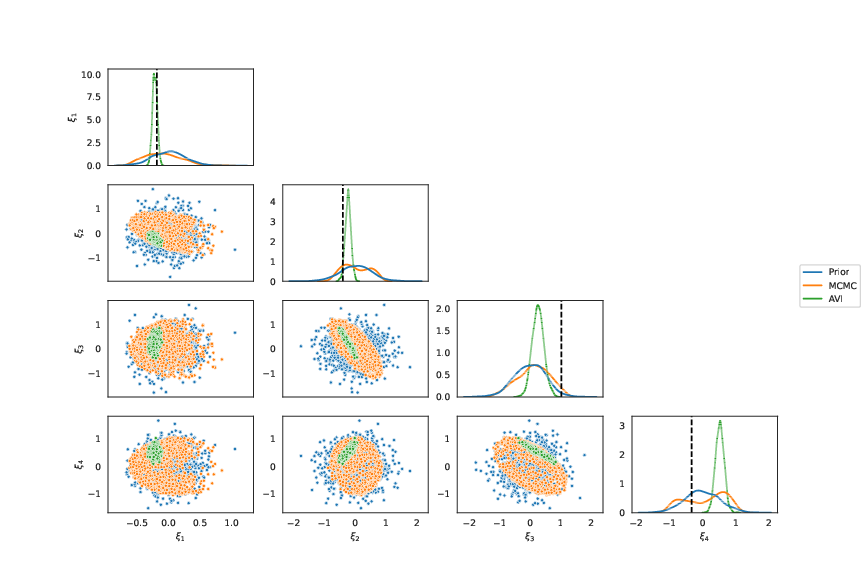

******************************************************************************************
51
Groundtruth:
 xi_data=[[-0.29558158 -0.59790266 -0.11515007  0.3395158 ]],
 y_data=[[ 1.7150301 -1.267218 ]]


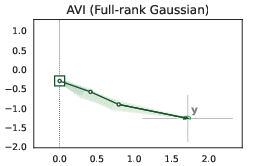

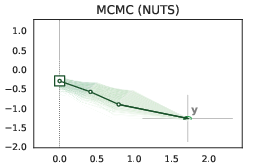

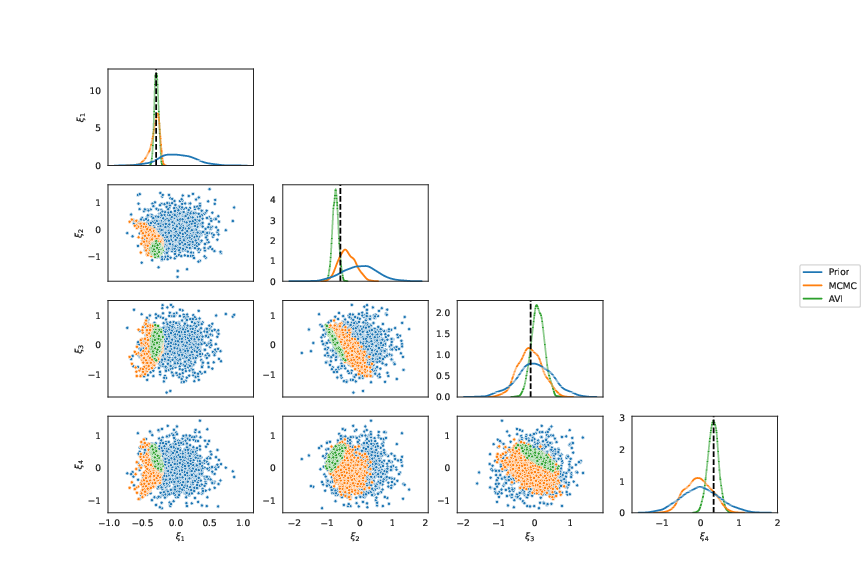

******************************************************************************************
52
Groundtruth:
 xi_data=[[-0.2612253  -0.15804912 -0.6190846  -0.33486474]],
 y_data=[[ 1.3090183 -1.5653344]]


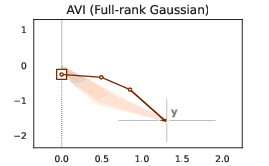

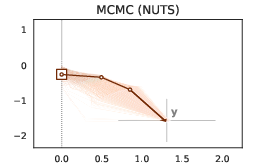

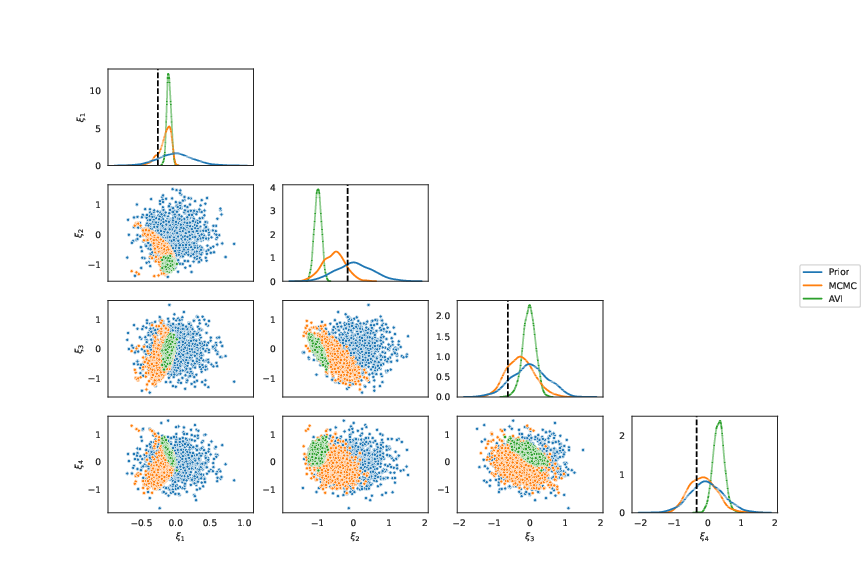

******************************************************************************************
53
Groundtruth:
 xi_data=[[ 0.01630807 -0.9538975  -0.19138382  0.5680554 ]],
 y_data=[[ 1.3326426 -1.3945755]]


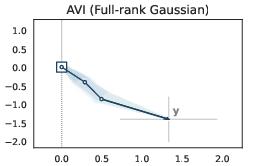

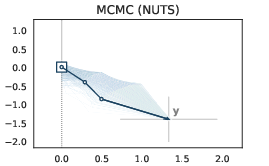

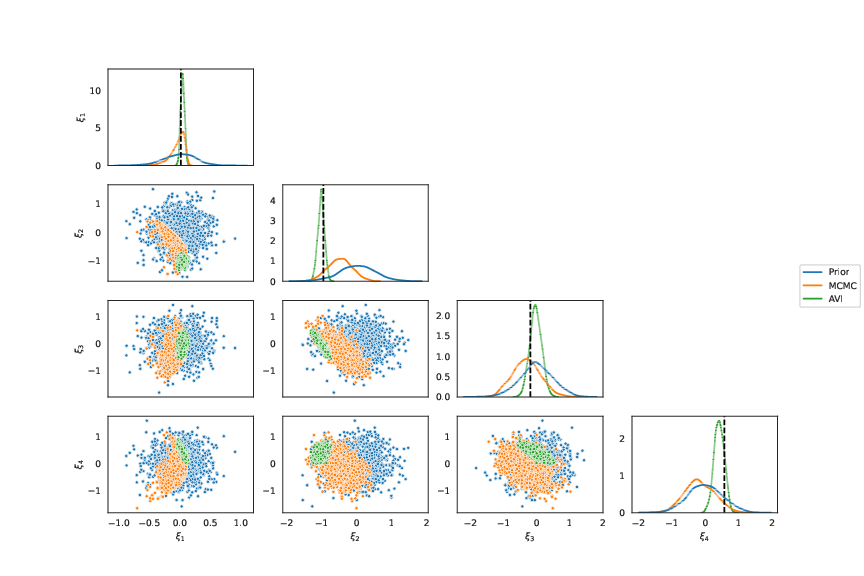

******************************************************************************************
54
Groundtruth:
 xi_data=[[-0.13383782  0.44142166 -0.45835465 -0.6532649 ]],
 y_data=[[ 1.74439  -0.563575]]


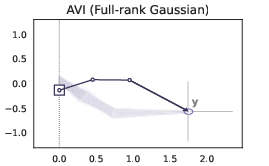

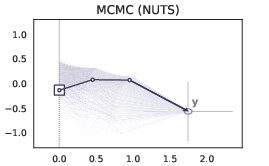

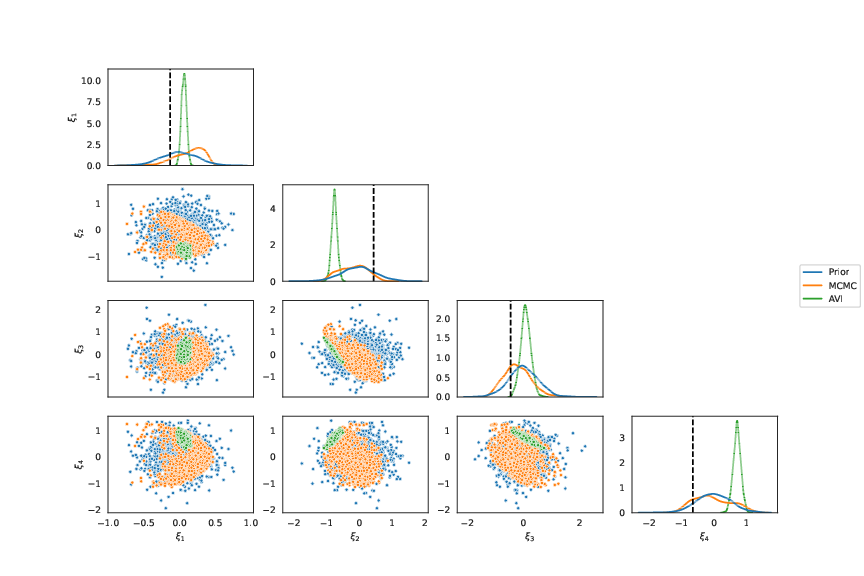

******************************************************************************************
55
Groundtruth:
 xi_data=[[-0.01615165  0.07741406 -0.19144724  0.57124233]],
 y_data=[[1.8828347  0.41239163]]


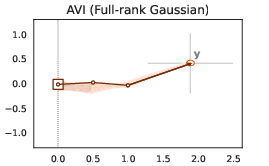

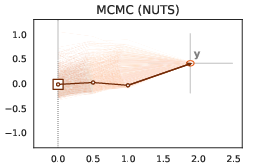

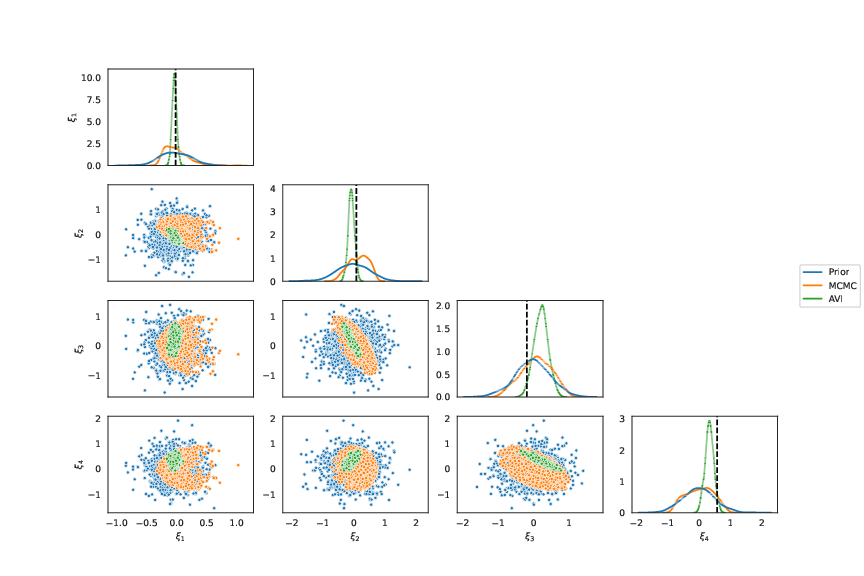

******************************************************************************************
56
Groundtruth:
 xi_data=[[0.01782466 0.1643745  0.14736433 0.5144463 ]],
 y_data=[[1.6458586  0.98576725]]


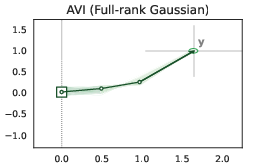

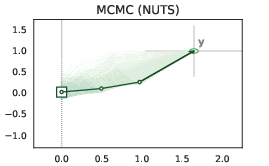

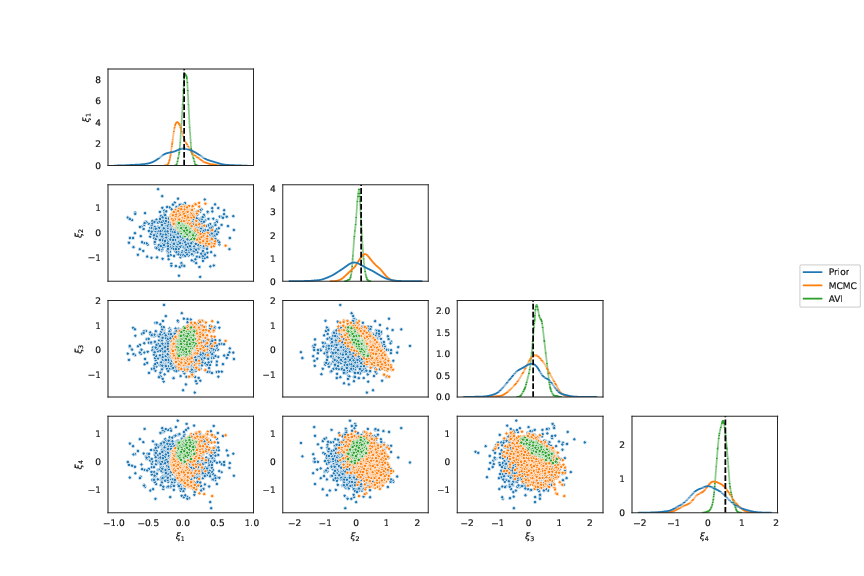

******************************************************************************************
57
Groundtruth:
 xi_data=[[-0.5418784  -0.39716935  0.61272794 -0.4674886 ]],
 y_data=[[ 1.9226763  -0.88124126]]


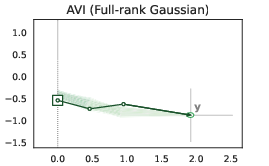

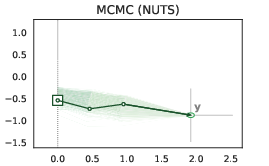

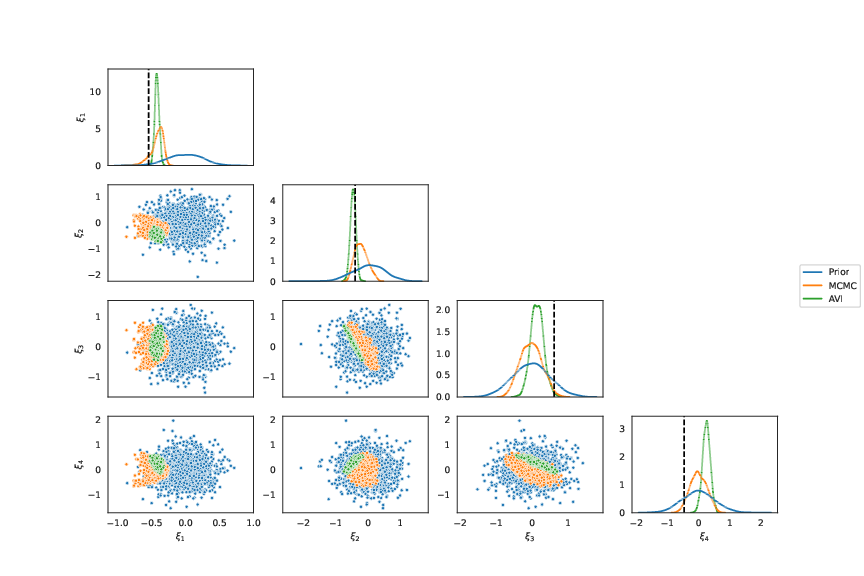

******************************************************************************************
58
Groundtruth:
 xi_data=[[-0.11196705 -0.4474425  -0.04879661 -0.15529925]],
 y_data=[[ 1.6766604 -1.1812061]]


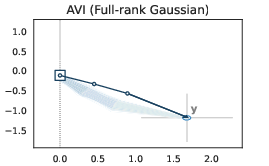

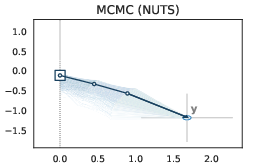

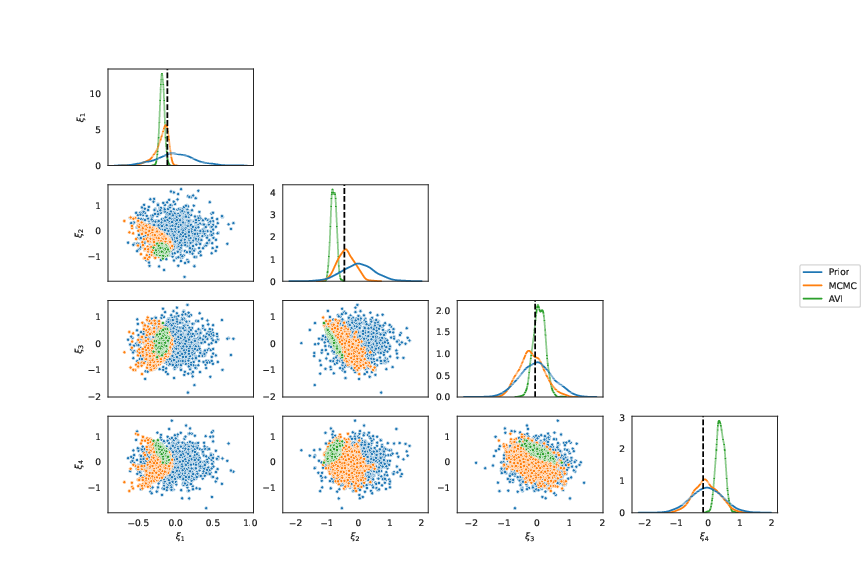

******************************************************************************************
59
Groundtruth:
 xi_data=[[ 0.12933306  0.18464306 -0.5106684  -0.1660388 ]],
 y_data=[[ 1.8496631 -0.3998201]]


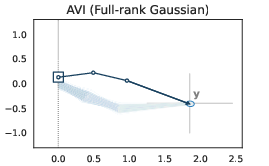

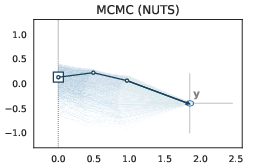

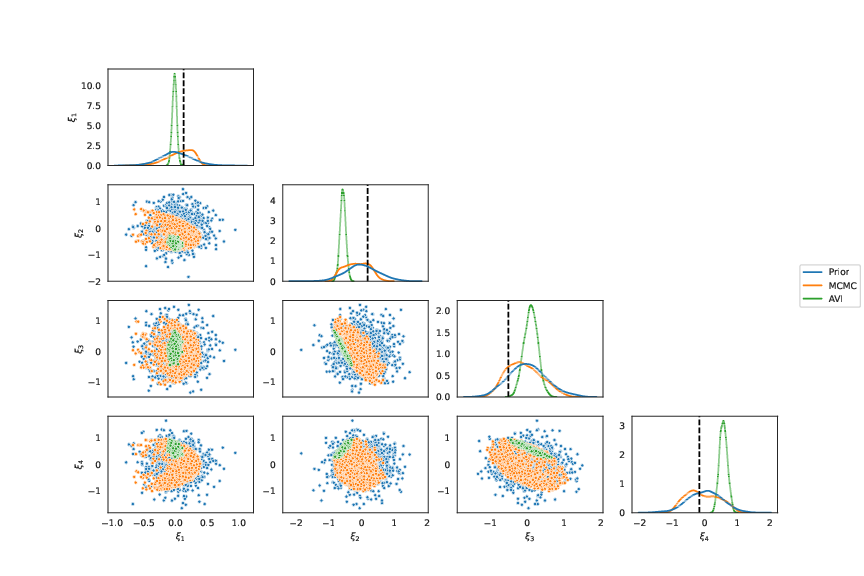

******************************************************************************************
60
Groundtruth:
 xi_data=[[-0.01018384  0.33876565  0.32405424 -0.39219338]],
 y_data=[[1.8257539 0.7199543]]


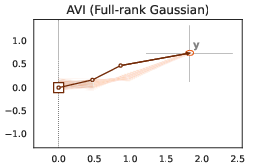

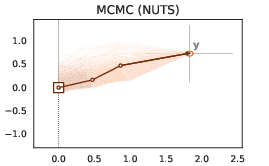

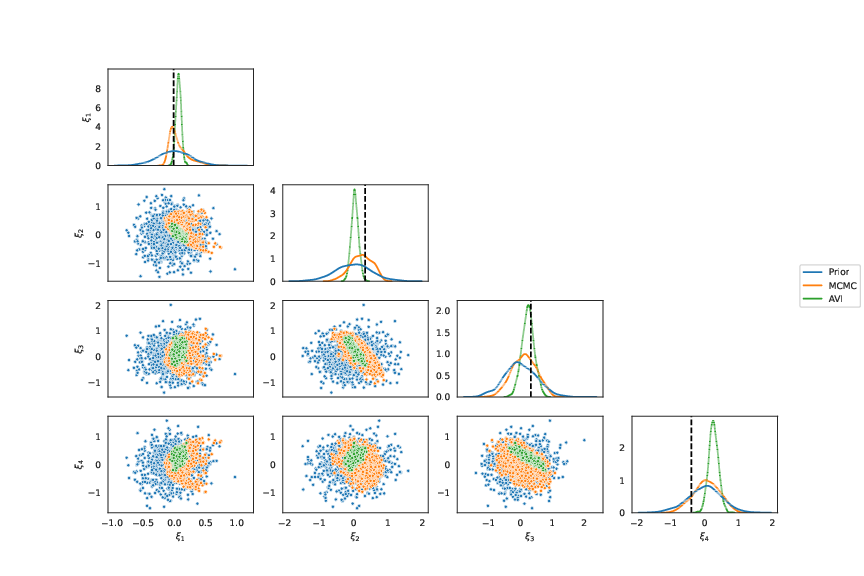

******************************************************************************************
61
Groundtruth:
 xi_data=[[ 0.13788648  0.42017156  0.37727174 -0.33808565]],
 y_data=[[1.7012174 1.141547 ]]


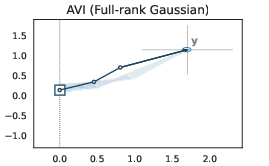

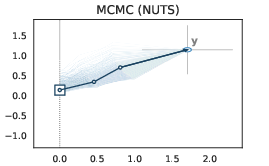

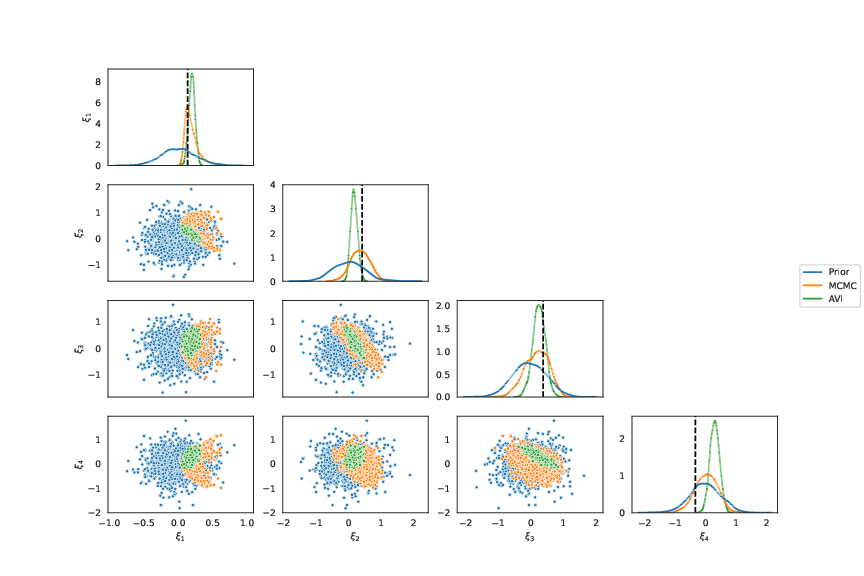

******************************************************************************************
62
Groundtruth:
 xi_data=[[-0.42534137 -0.28018254  0.2124455   0.47738516]],
 y_data=[[ 1.9020615  -0.19390287]]


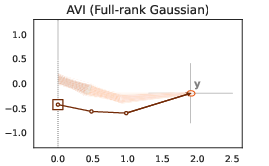

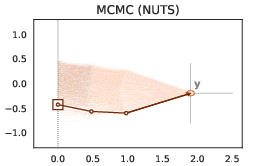

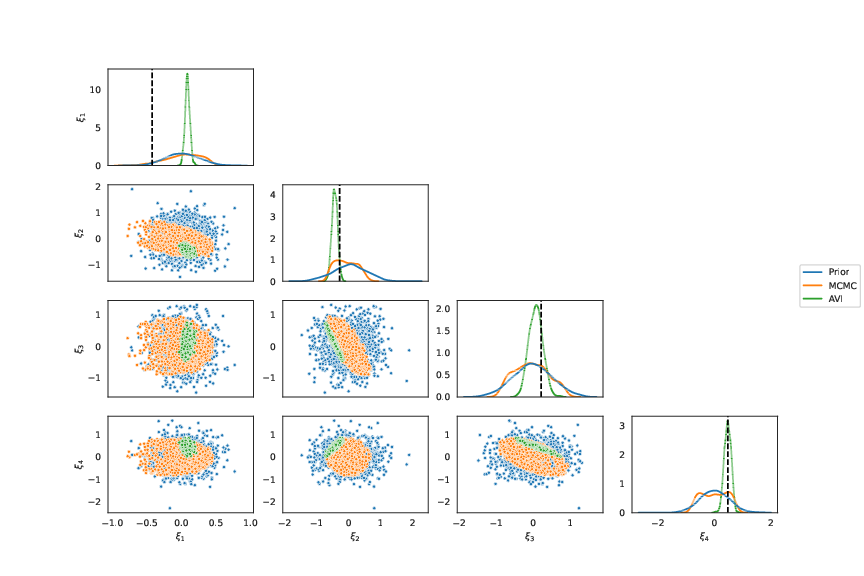

******************************************************************************************
63
Groundtruth:
 xi_data=[[ 0.22205442 -0.19162466 -0.43090177  0.23980567]],
 y_data=[[ 1.823604  -0.5309527]]


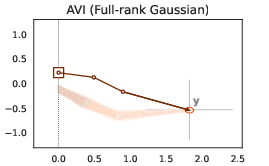

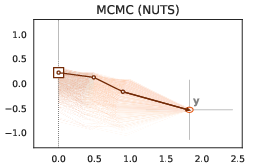

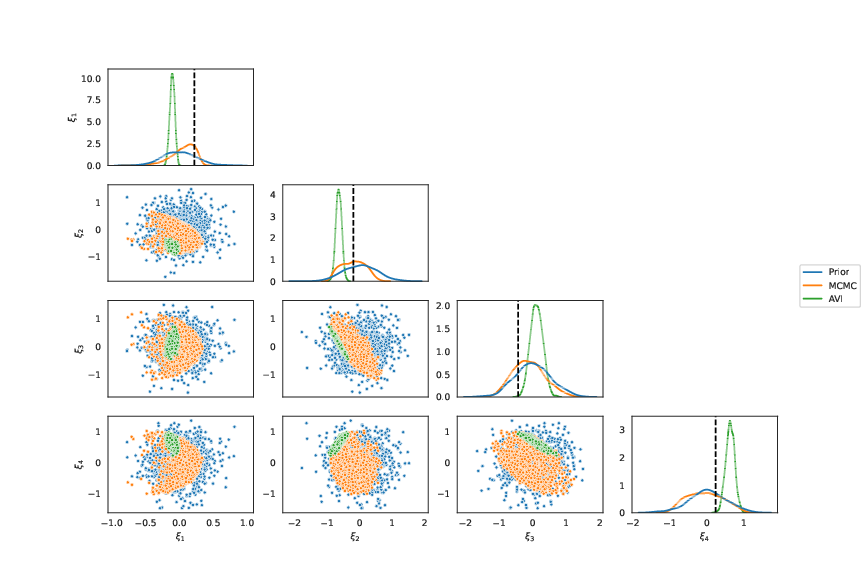

******************************************************************************************
64
Groundtruth:
 xi_data=[[ 0.00978542 -0.12573428  0.80302143 -1.0132083 ]],
 y_data=[[ 1.8334569  -0.04899484]]


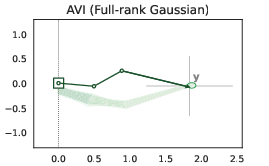

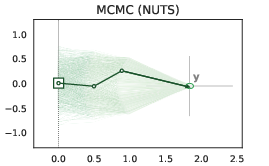

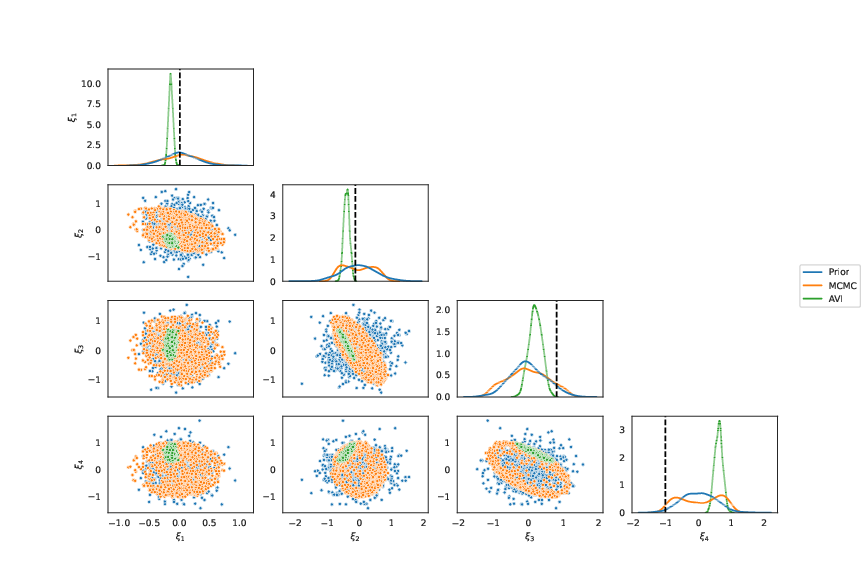

******************************************************************************************
65
Groundtruth:
 xi_data=[[ 0.48897266  0.1180465   0.63154227 -0.725969  ]],
 y_data=[[1.8662935 0.909024 ]]


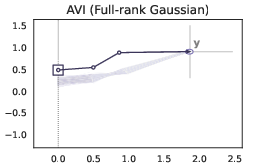

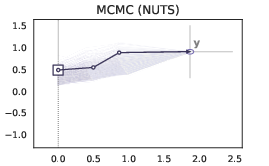

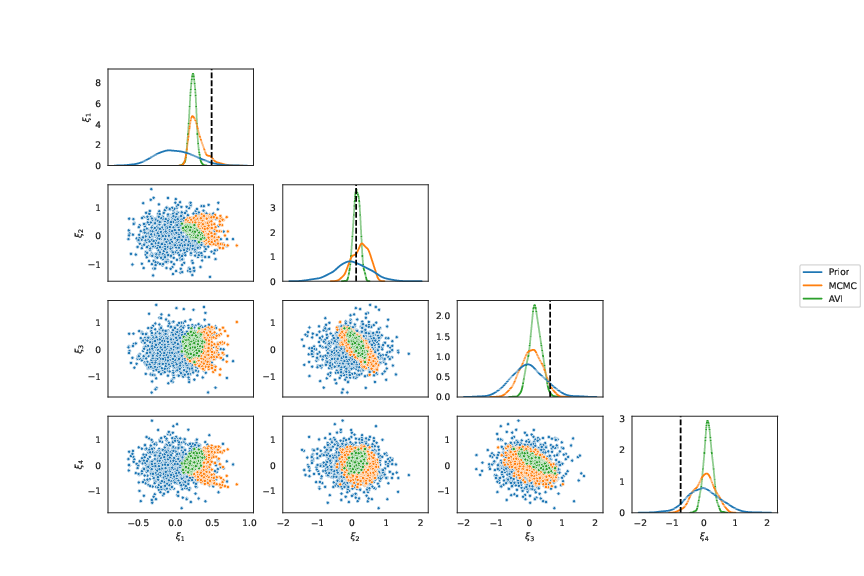

******************************************************************************************
66
Groundtruth:
 xi_data=[[ 0.2337204   0.13578802  0.18791185 -0.4976744 ]],
 y_data=[[1.9492686 0.2918544]]


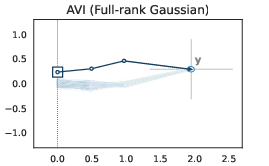

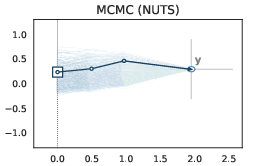

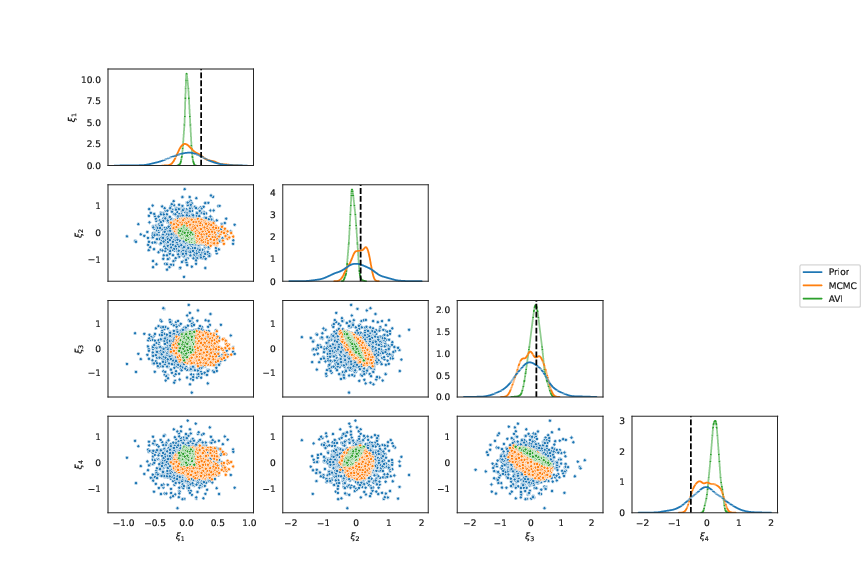

******************************************************************************************
67
Groundtruth:
 xi_data=[[-0.21971303 -0.18331884  0.39666212 -0.45715746]],
 y_data=[[ 1.9376407  -0.43184432]]


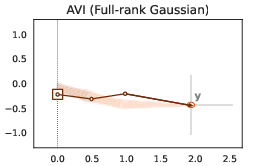

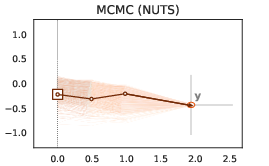

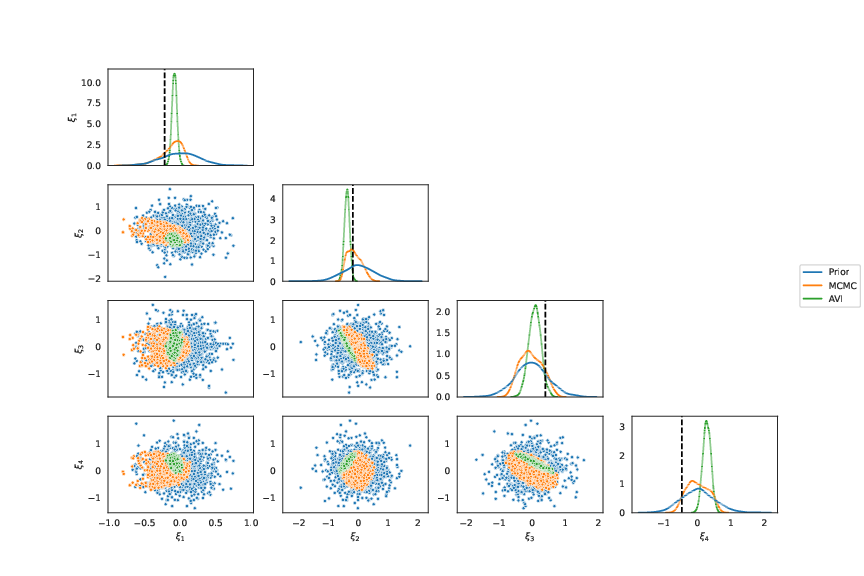

******************************************************************************************
68
Groundtruth:
 xi_data=[[-0.09971491 -0.4552935   0.8418546  -0.19807503]],
 y_data=[[1.9081987  0.04429439]]


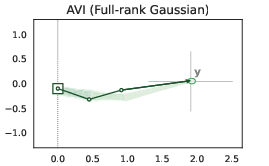

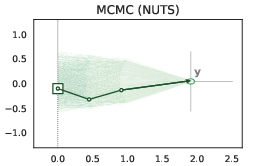

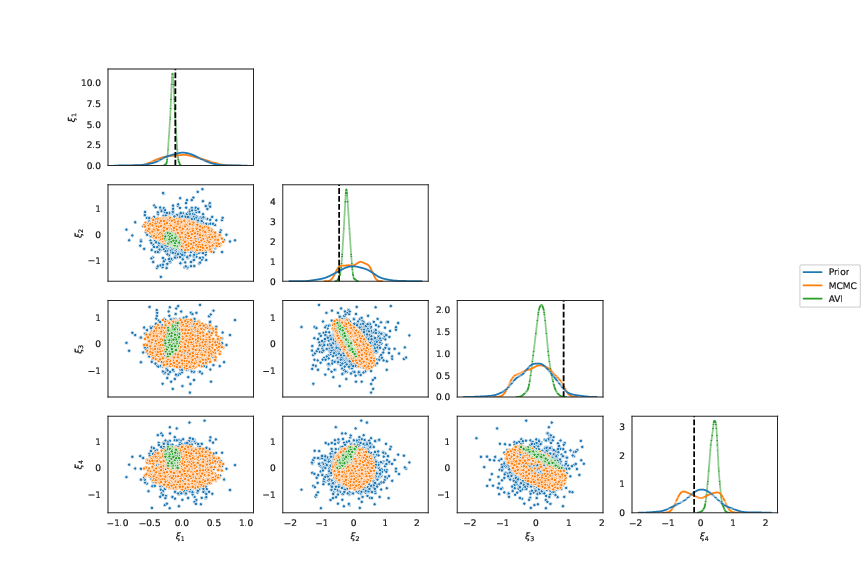

******************************************************************************************
69
Groundtruth:
 xi_data=[[ 0.36297804 -0.19254796 -0.9324686  -0.8107888 ]],
 y_data=[[ 0.3375103 -1.1233644]]


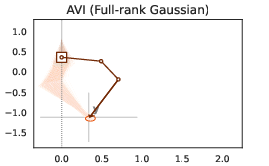

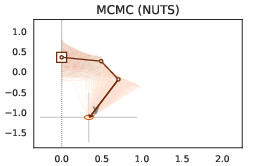

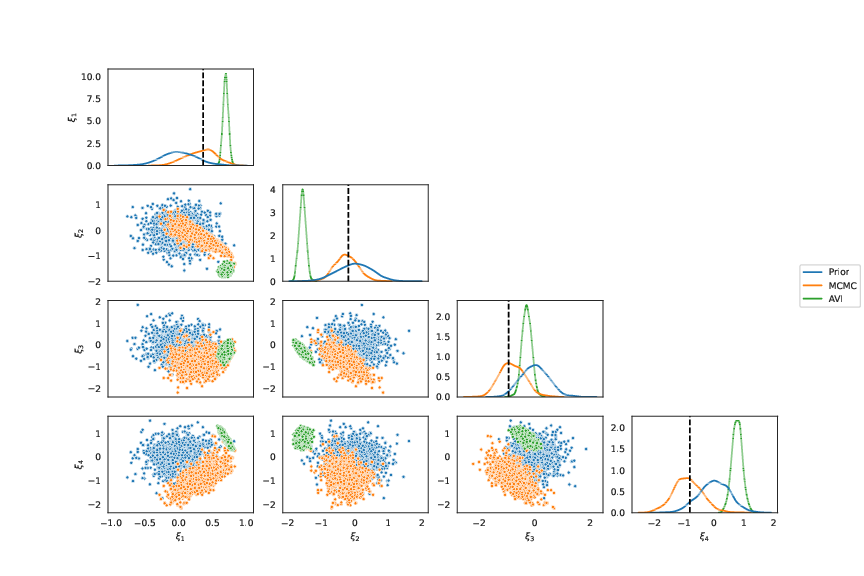

******************************************************************************************
70
Groundtruth:
 xi_data=[[-0.05009776 -0.35663232 -0.36381075 -0.1302936 ]],
 y_data=[[ 1.5089494 -1.3167384]]


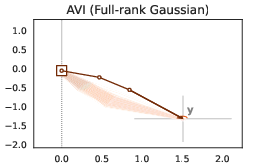

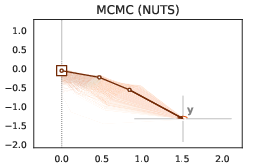

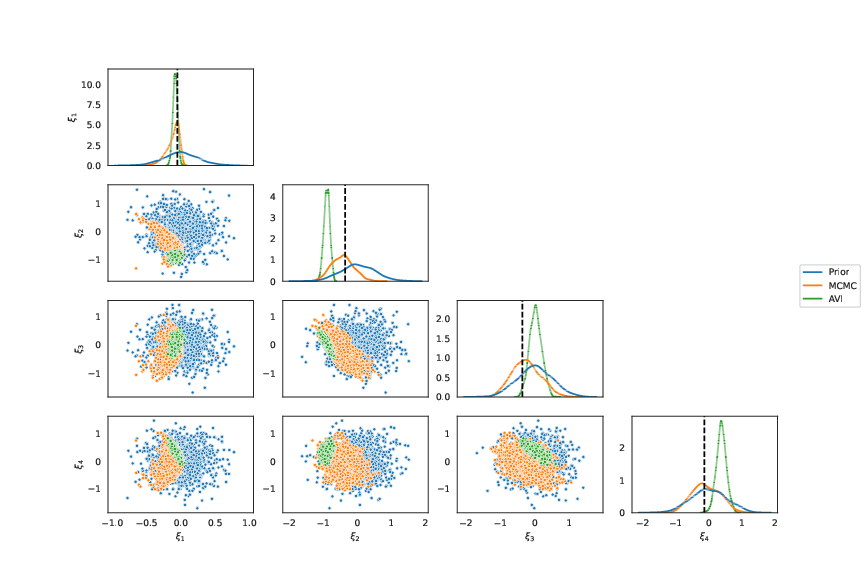

******************************************************************************************
71
Groundtruth:
 xi_data=[[0.04220667 0.25608024 0.45311964 0.50472444]],
 y_data=[[1.2020967 1.4350487]]


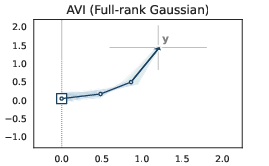

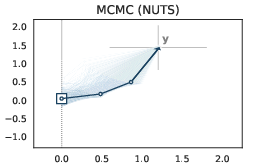

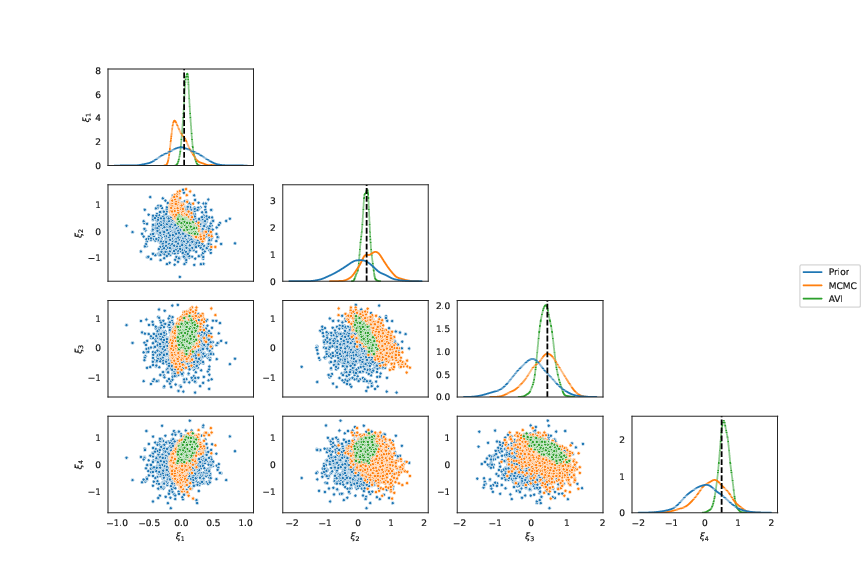

******************************************************************************************
72
Groundtruth:
 xi_data=[[-0.2423667  -0.51187456 -0.6100155   0.09252993]],
 y_data=[[ 1.1654661 -1.8156972]]


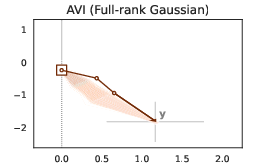

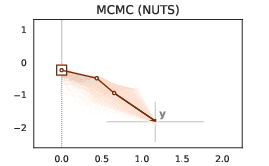

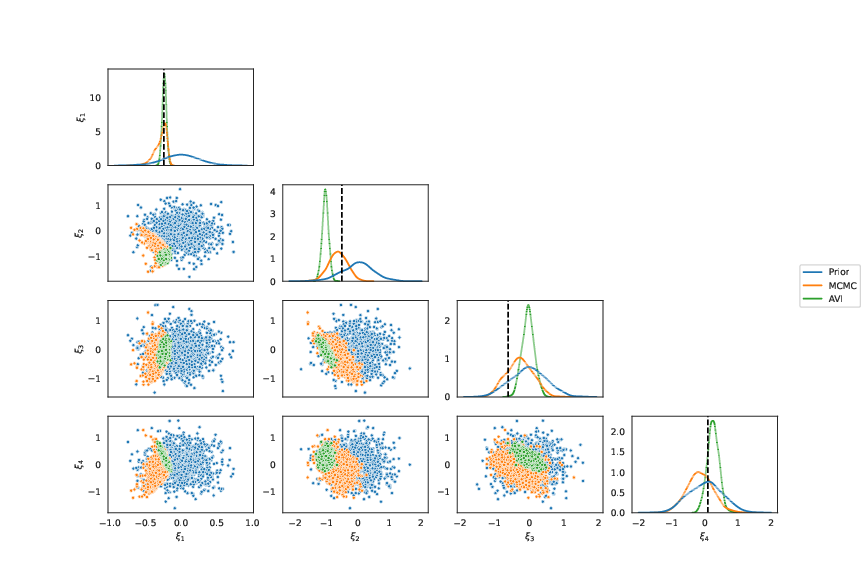

******************************************************************************************
73
Groundtruth:
 xi_data=[[-0.16191031  0.14761263  0.36009118 -1.1103321 ]],
 y_data=[[ 1.7656206  -0.41022822]]


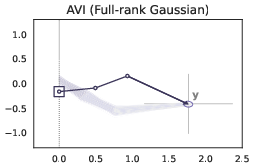

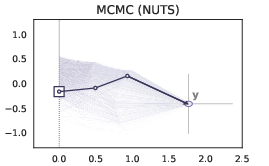

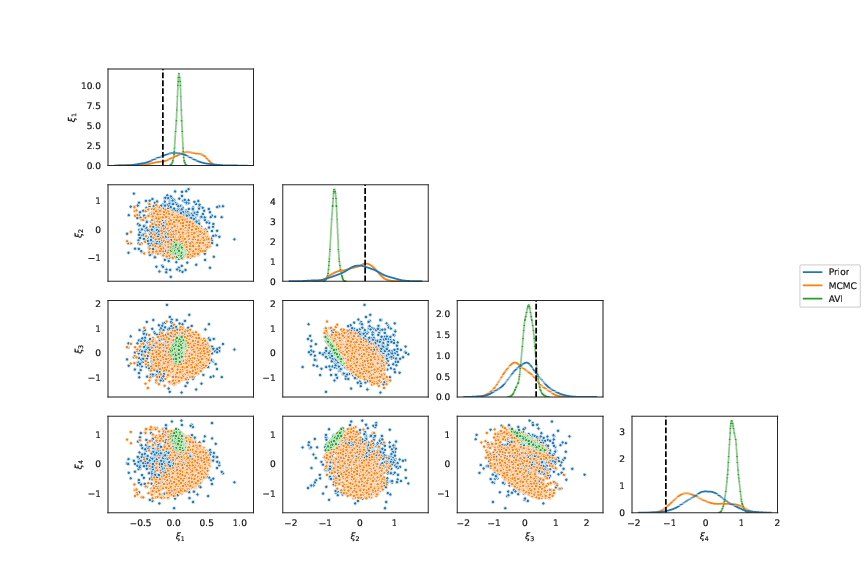

******************************************************************************************
74
Groundtruth:
 xi_data=[[-0.1708912  -0.26408657 -0.47837767  0.51066804]],
 y_data=[[ 1.8234665 -0.8525381]]


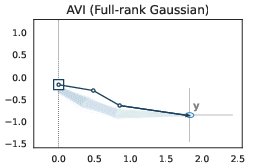

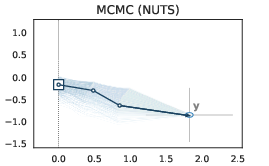

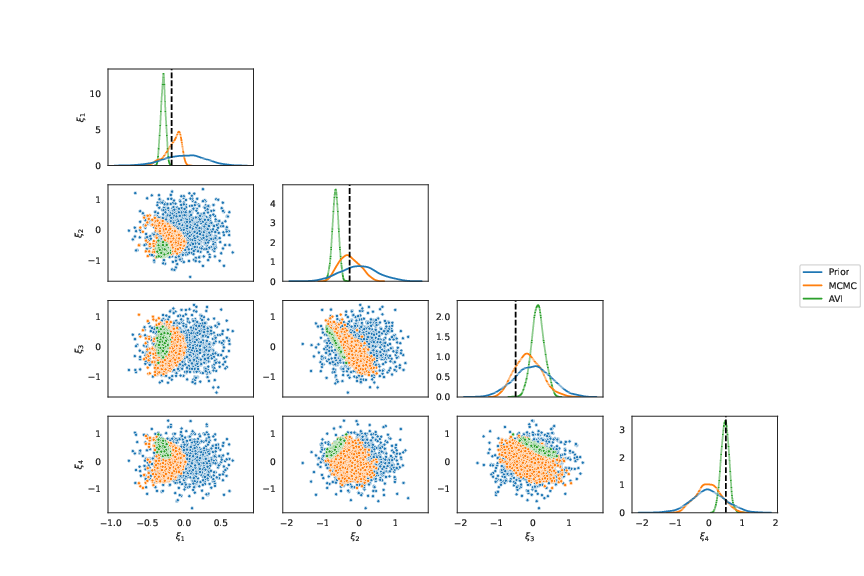

******************************************************************************************
75
Groundtruth:
 xi_data=[[-0.17277923 -0.8206199  -0.13679518 -0.05754584]],
 y_data=[[ 1.160357  -1.8127955]]


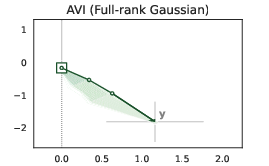

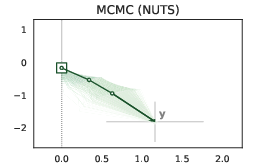

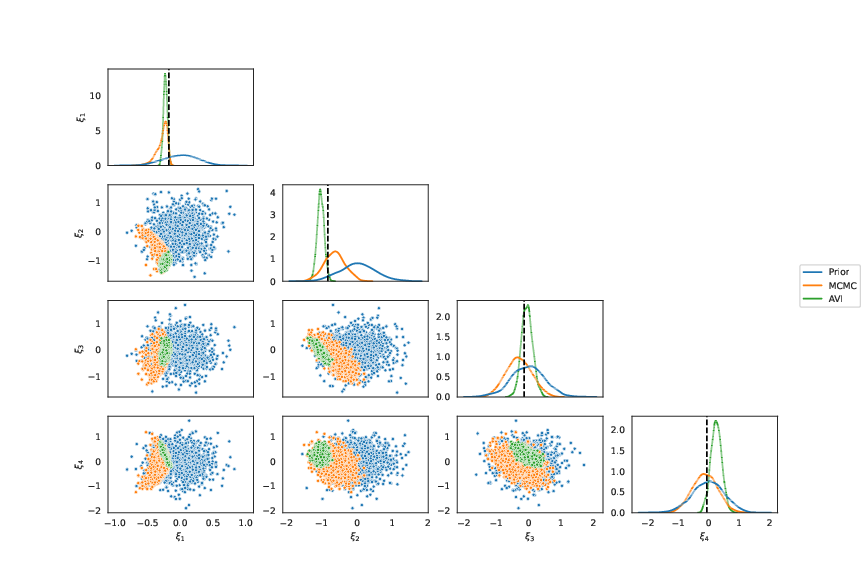

******************************************************************************************
76
Groundtruth:
 xi_data=[[ 0.11978137  0.06682526  0.6297776  -0.17578703]],
 y_data=[[1.7461491  0.97026354]]


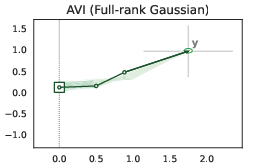

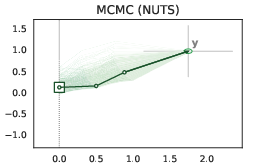

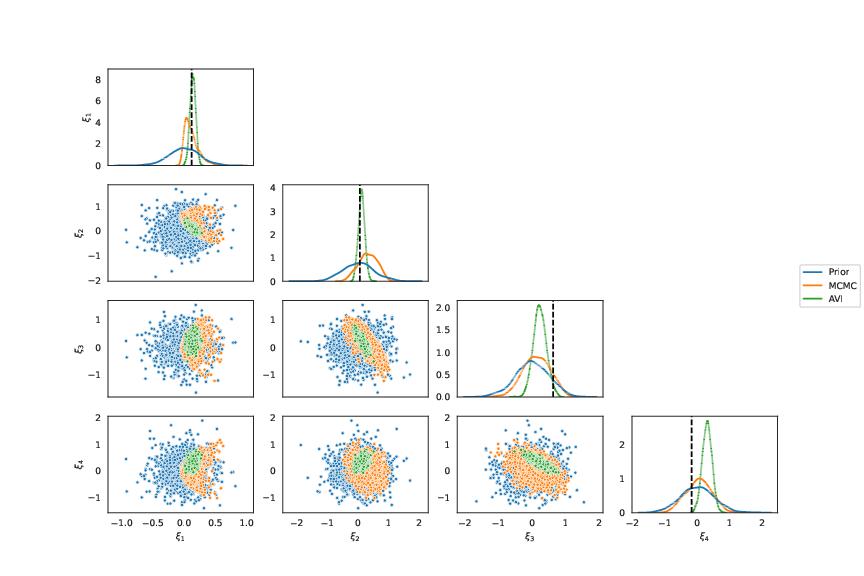

******************************************************************************************
77
Groundtruth:
 xi_data=[[-0.25773078  0.38594365 -0.06148838  1.264454  ]],
 y_data=[[0.90079075 1.0639609 ]]


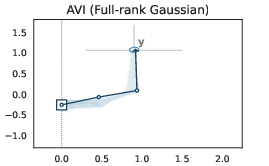

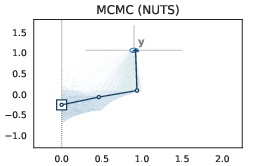

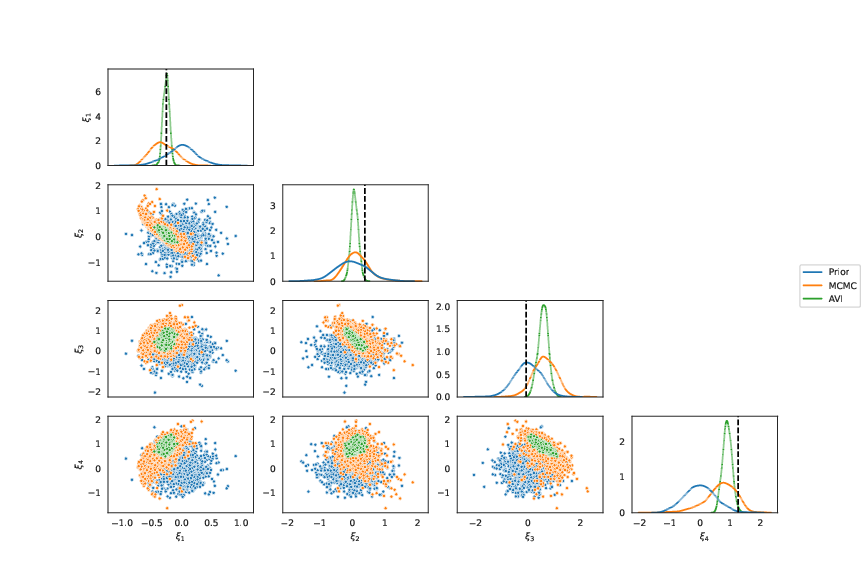

******************************************************************************************
78
Groundtruth:
 xi_data=[[ 0.72940147  0.09113333 -0.1141438   0.1213111 ]],
 y_data=[[2.0085971 0.8621854]]


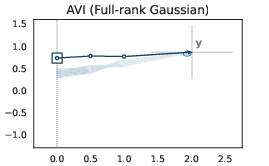

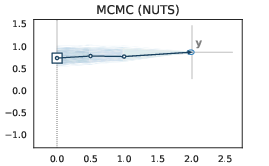

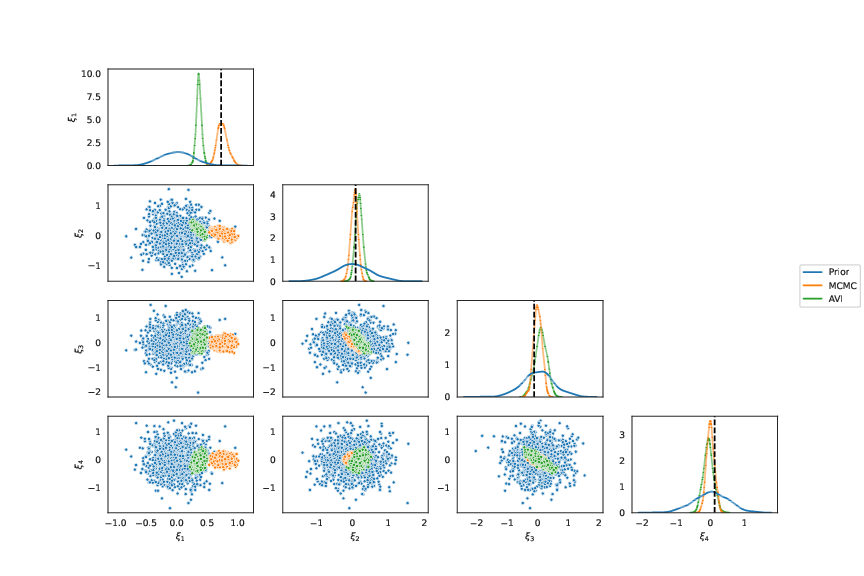

******************************************************************************************
79
Groundtruth:
 xi_data=[[-0.01841467 -0.28478864  0.24357727  0.46163157]],
 y_data=[[1.8977423  0.22978161]]


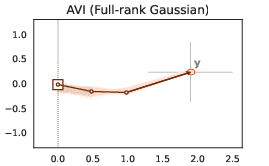

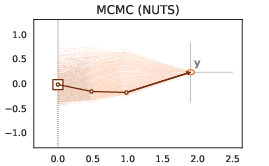

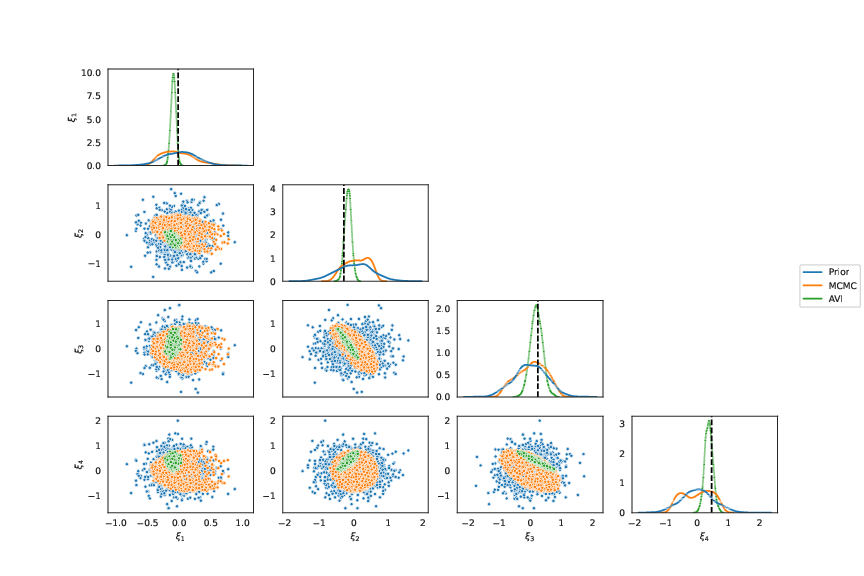

******************************************************************************************
80
Groundtruth:
 xi_data=[[-0.16644555  0.24064171 -0.31698385 -0.14895928]],
 y_data=[[ 1.9557877  -0.30858606]]


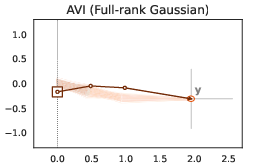

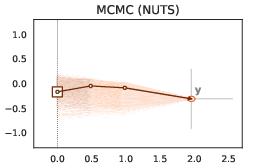

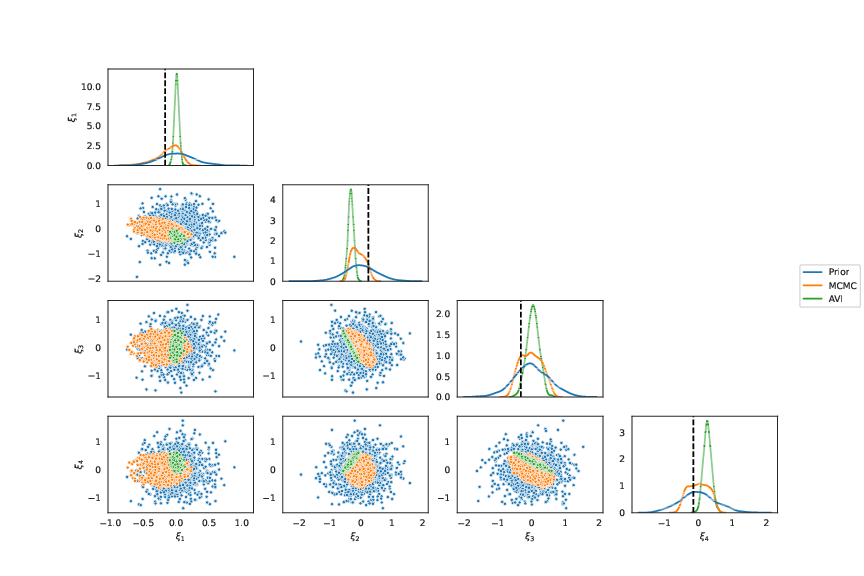

******************************************************************************************
81
Groundtruth:
 xi_data=[[ 0.06581689  0.8724755   0.53002596 -0.12132716]],
 y_data=[[0.6777096 1.9198107]]


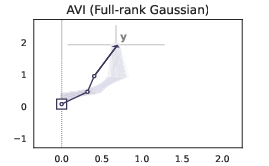

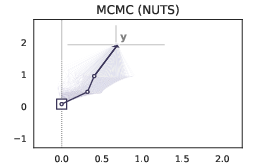

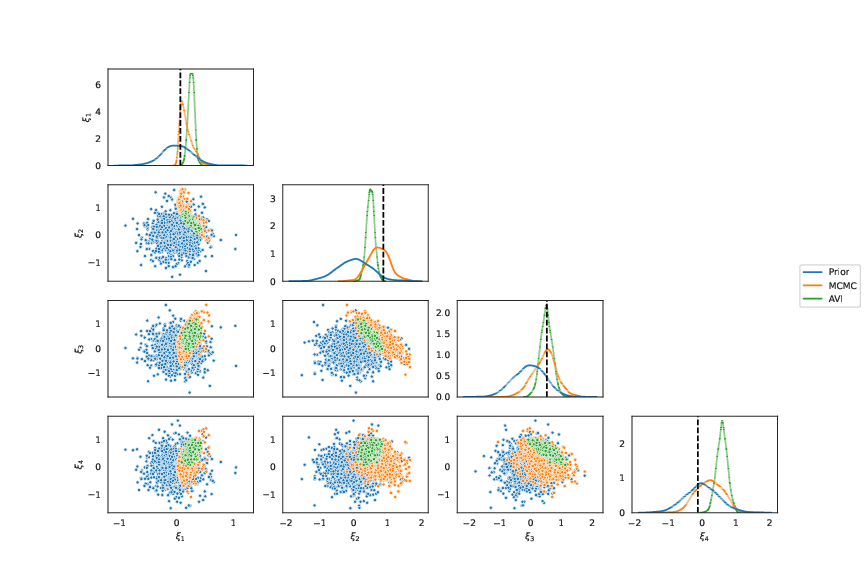

******************************************************************************************
82
Groundtruth:
 xi_data=[[-0.09016655 -0.77321696  0.6092394  -0.29976863]],
 y_data=[[ 1.7535889 -0.9752316]]


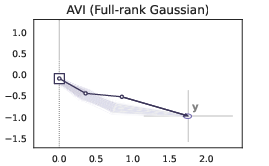

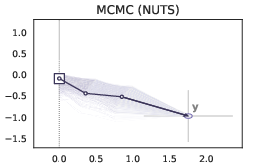

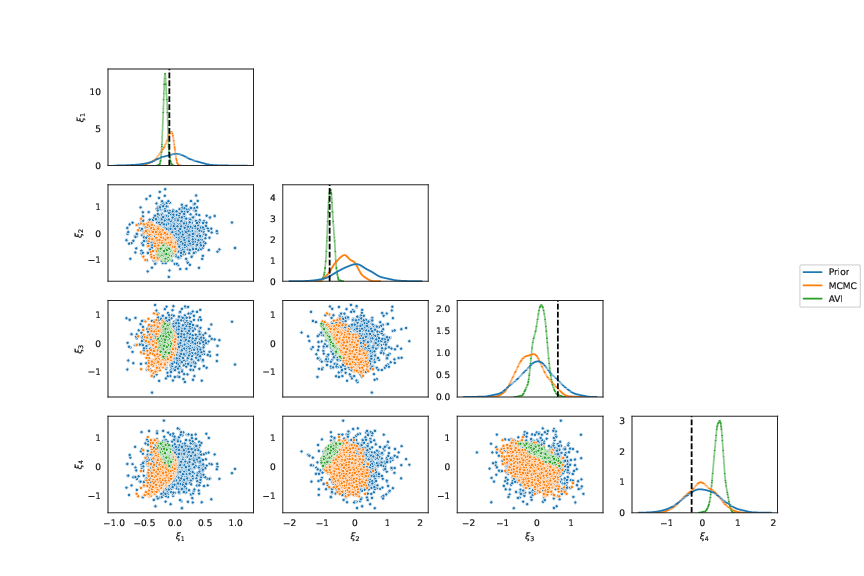

******************************************************************************************
83
Groundtruth:
 xi_data=[[ 0.17548673  0.4547433   0.9629493  -0.36563227]],
 y_data=[[1.0191715 1.7621418]]


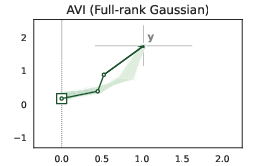

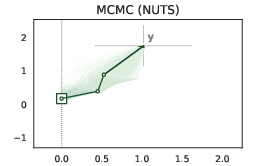

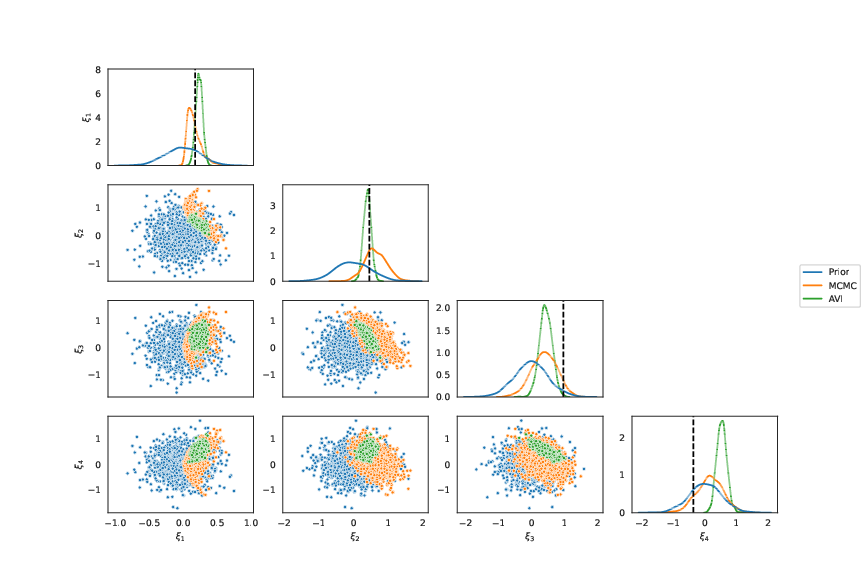

******************************************************************************************
84
Groundtruth:
 xi_data=[[ 0.09300697  0.02737242  1.3217402  -0.45061025]],
 y_data=[[1.2221367 1.3902044]]


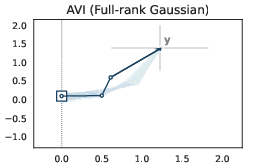

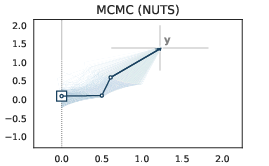

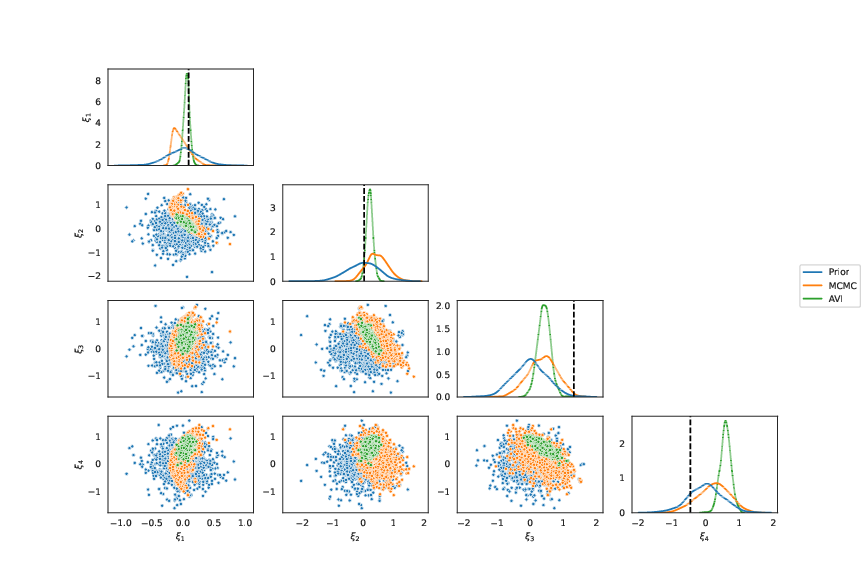

******************************************************************************************
85
Groundtruth:
 xi_data=[[-1.70681742e-04 -3.33414376e-01  6.54060364e-01 -1.11504935e-01]],
 y_data=[[1.9410712  0.20898445]]


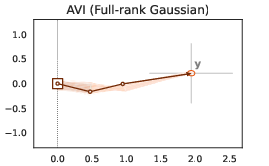

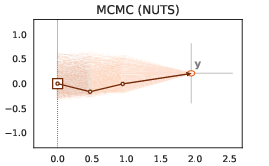

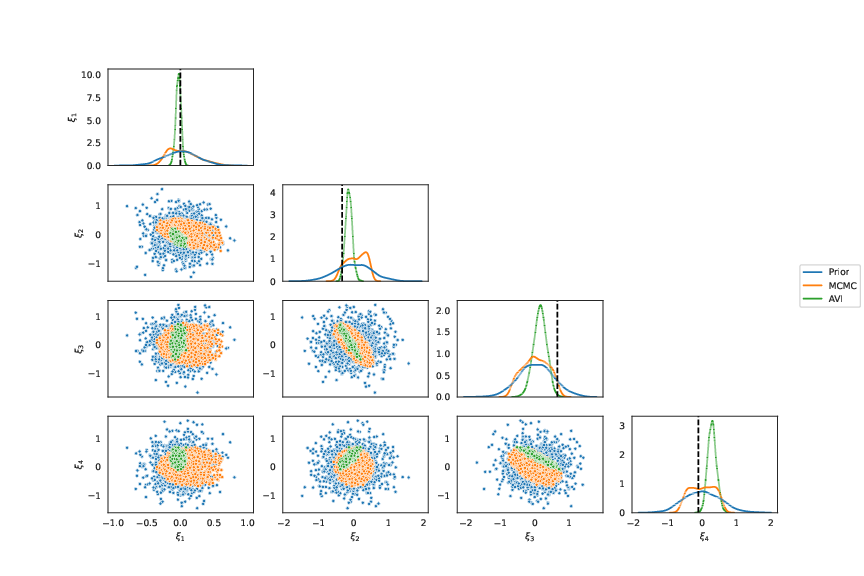

******************************************************************************************
86
Groundtruth:
 xi_data=[[-0.0636671   0.02403352 -0.52329856  0.20352589]],
 y_data=[[ 1.8867428  -0.57962793]]


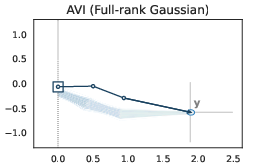

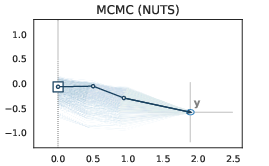

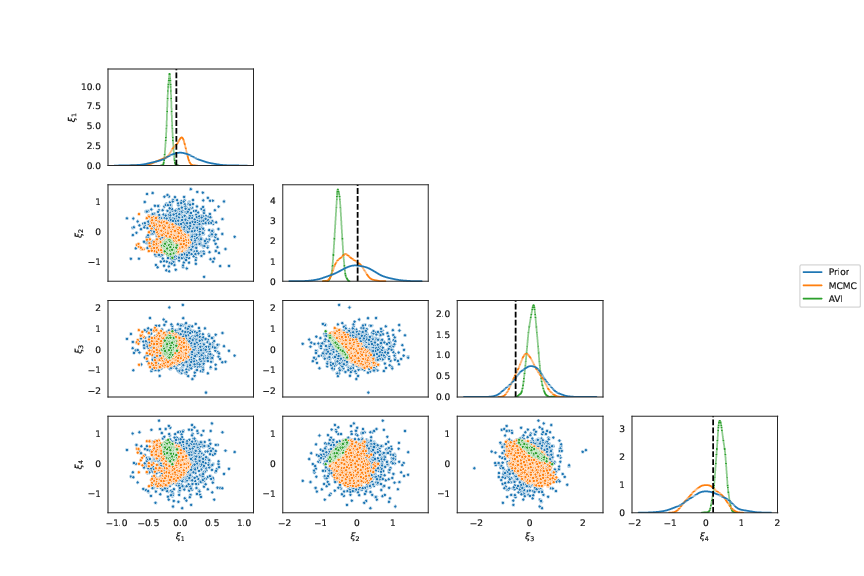

******************************************************************************************
87
Groundtruth:
 xi_data=[[ 0.01491649  0.17691204  0.36685705 -0.20772322]],
 y_data=[[1.8705676 0.6881834]]


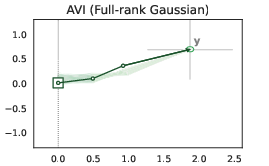

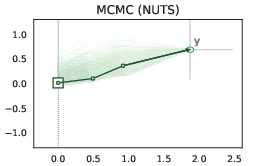

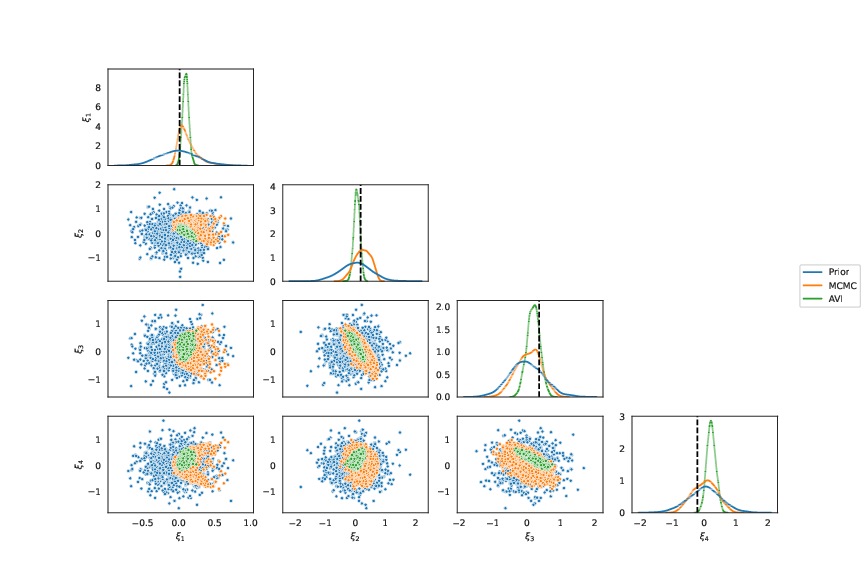

******************************************************************************************
88
Groundtruth:
 xi_data=[[ 0.11423293 -0.60461223 -0.34545985 -0.5652232 ]],
 y_data=[[ 0.7699921 -1.5646613]]


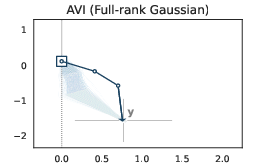

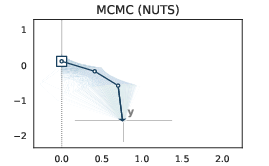

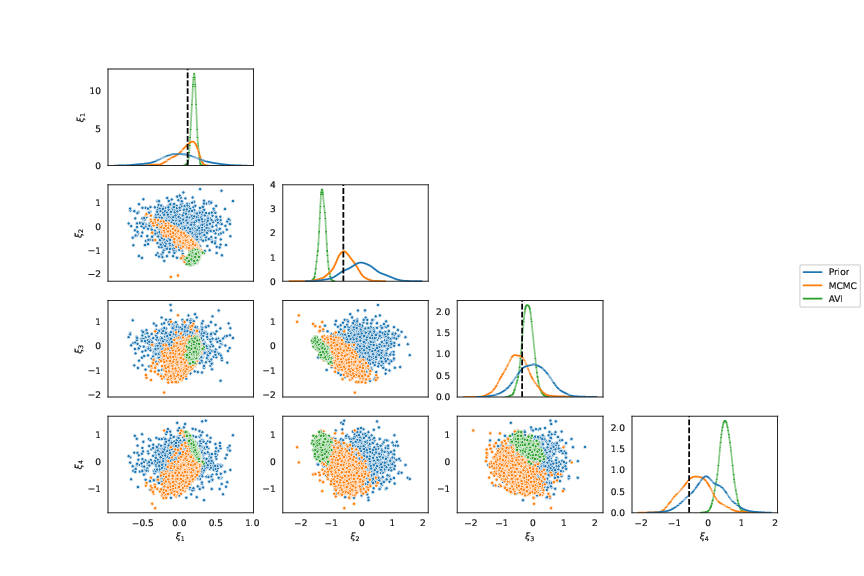

******************************************************************************************
89
Groundtruth:
 xi_data=[[-0.21020356  0.29912058  0.7313091  -0.42524105]],
 y_data=[[1.5469943  0.92800915]]


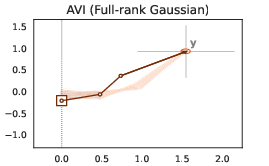

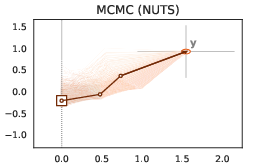

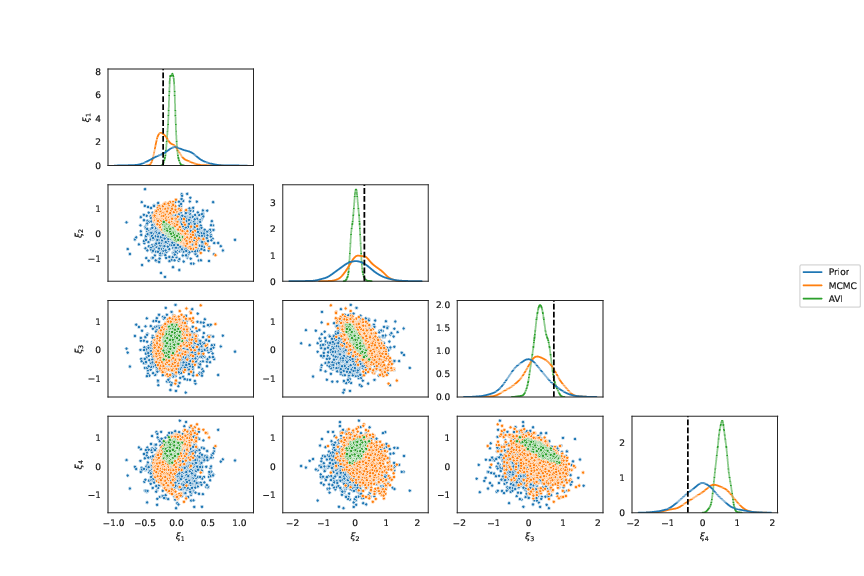

******************************************************************************************
90
Groundtruth:
 xi_data=[[-0.21562727 -0.00450269  0.11378993  0.11406089]],
 y_data=[[1.9861404  0.06976677]]


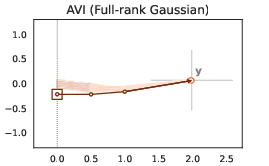

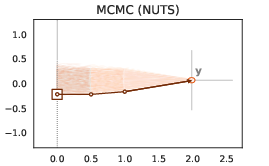

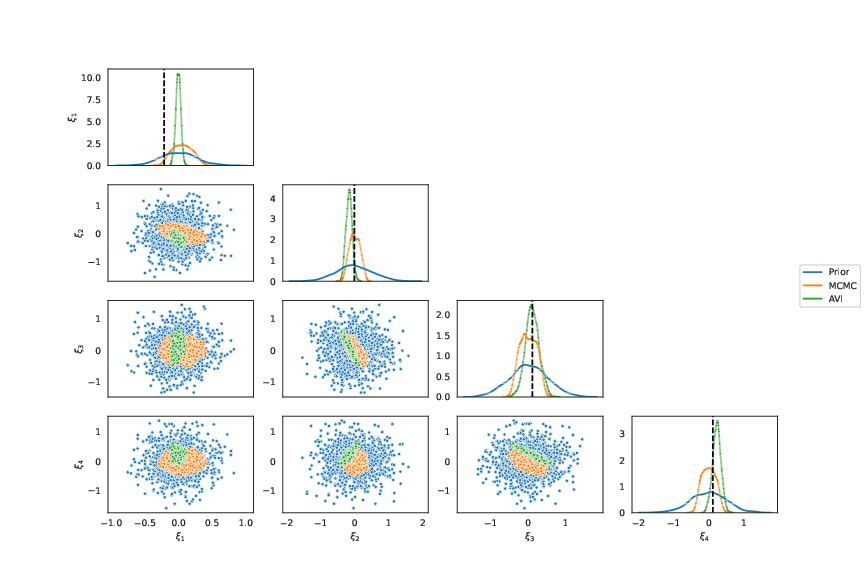

******************************************************************************************
91
Groundtruth:
 xi_data=[[ 0.00932077 -0.29581058 -0.36723393 -0.86727184]],
 y_data=[[ 0.8999648 -1.4358517]]


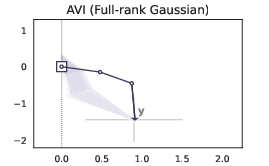

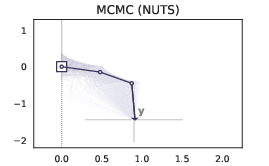

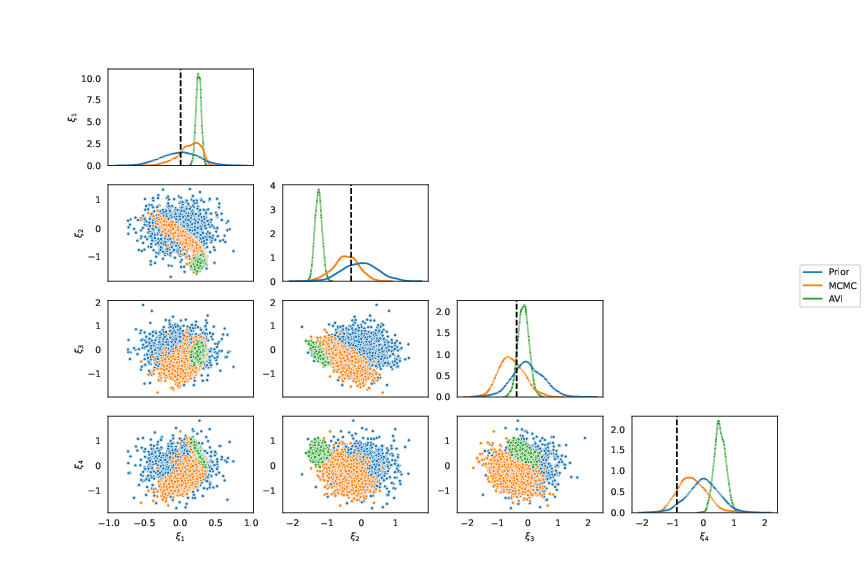

******************************************************************************************
92
Groundtruth:
 xi_data=[[ 0.03473756  0.33038324 -0.00806682 -0.9201538 ]],
 y_data=[[ 1.7687088  -0.20761617]]


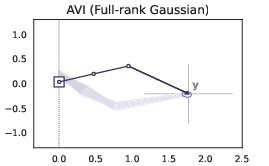

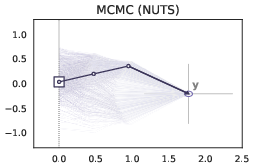

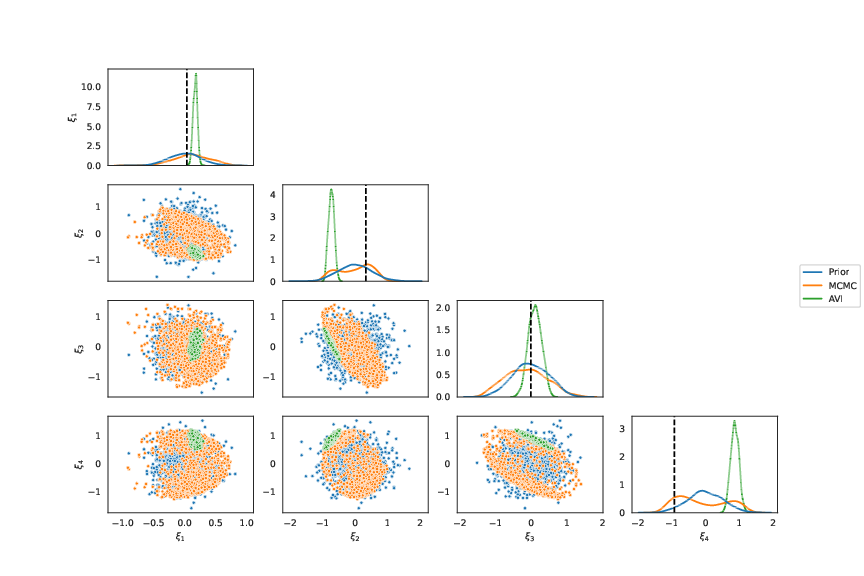

******************************************************************************************
93
Groundtruth:
 xi_data=[[-0.433144    0.22811839 -0.3764964  -0.14261498]],
 y_data=[[ 1.943505  -0.6839934]]


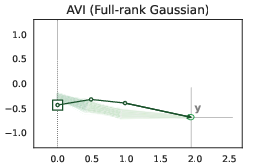

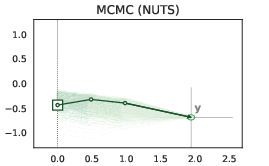

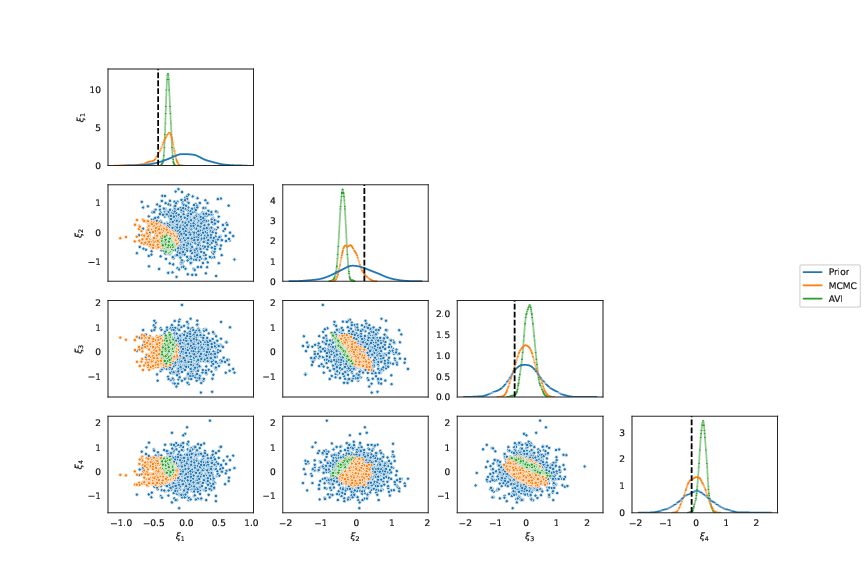

******************************************************************************************
94
Groundtruth:
 xi_data=[[ 0.48109677  0.491524   -0.06198272  0.73943746]],
 y_data=[[1.286956  1.8377283]]


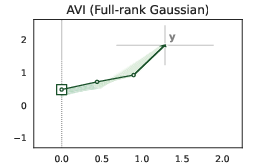

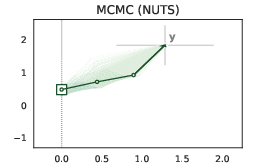

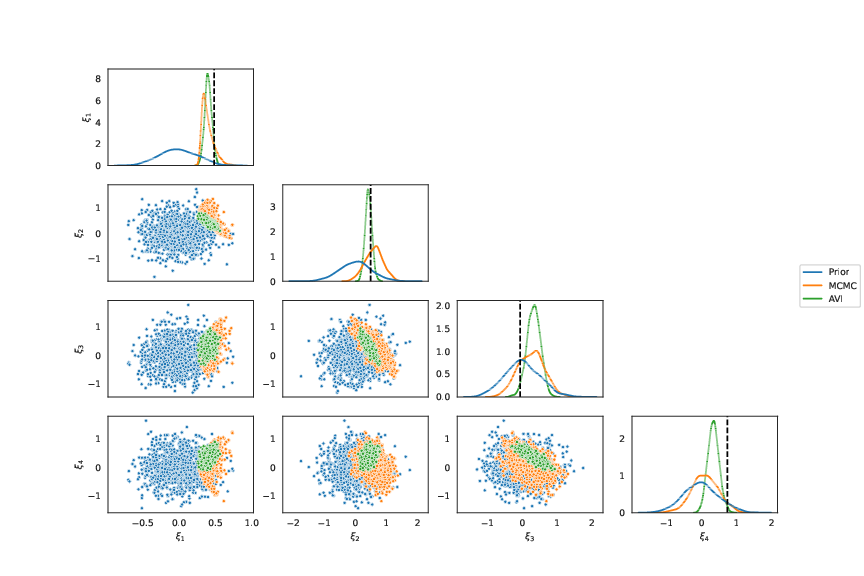

******************************************************************************************
95
Groundtruth:
 xi_data=[[-0.09224791  0.11788535  0.28028268  0.7211992 ]],
 y_data=[[1.3996707 1.0494748]]


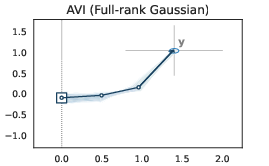

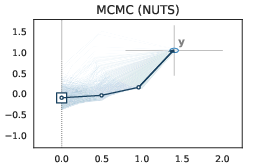

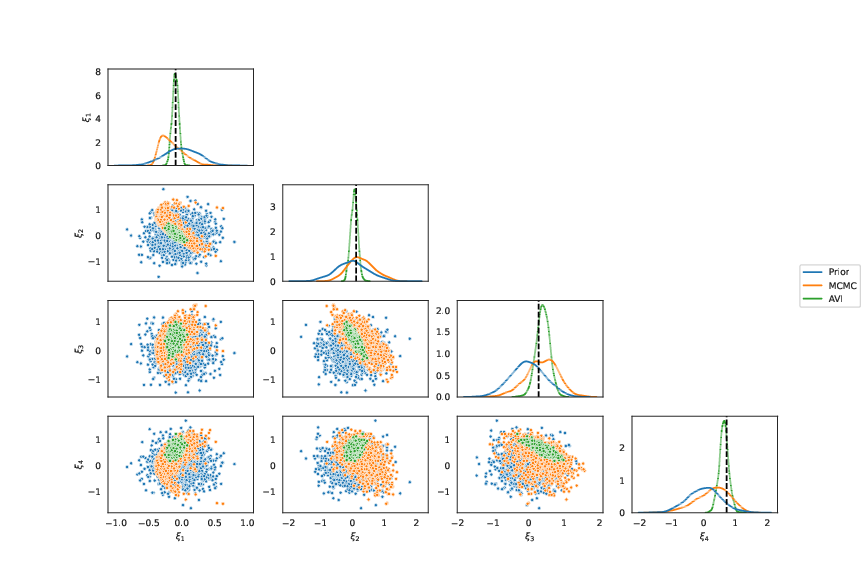

******************************************************************************************
96
Groundtruth:
 xi_data=[[-0.11757514 -0.35256436  0.25525242  0.17679648]],
 y_data=[[ 1.963243   -0.27533385]]


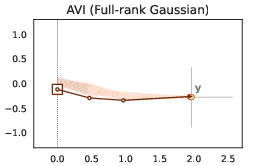

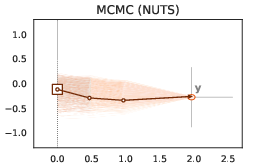

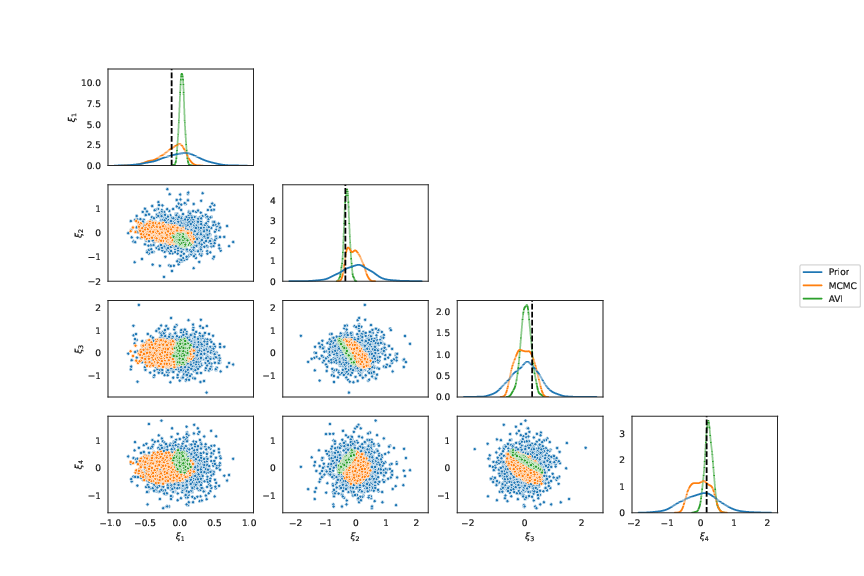

******************************************************************************************
97
Groundtruth:
 xi_data=[[ 0.03867042  0.7878777  -0.4591129  -0.95894504]],
 y_data=[[ 1.6315098  -0.04351047]]


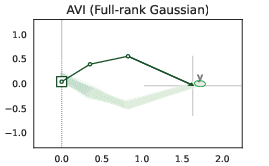

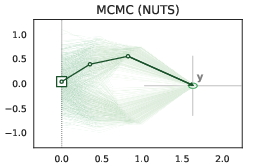

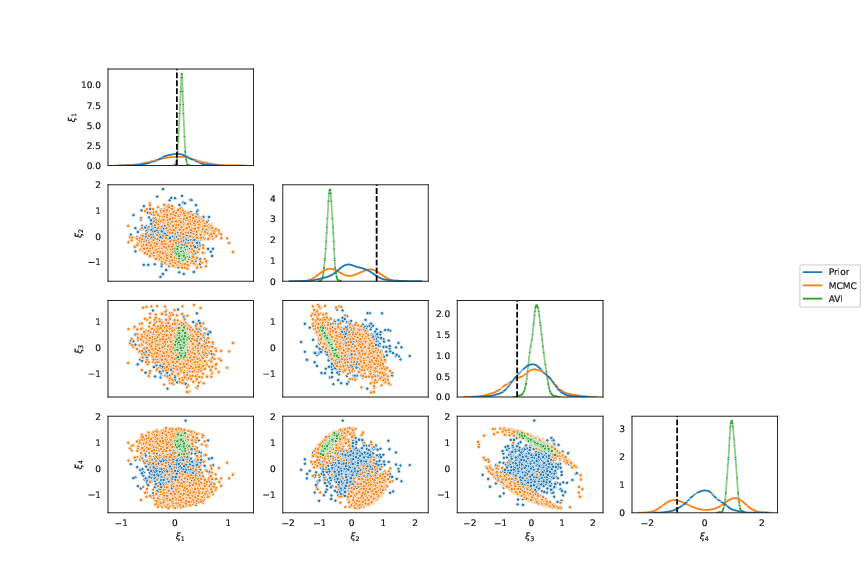

******************************************************************************************
98
Groundtruth:
 xi_data=[[ 0.46946532 -0.48230124  0.53592145 -0.30935252]],
 y_data=[[1.9159331  0.01717854]]


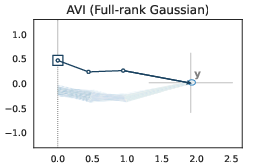

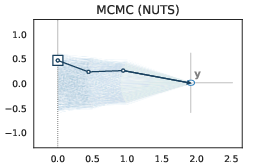

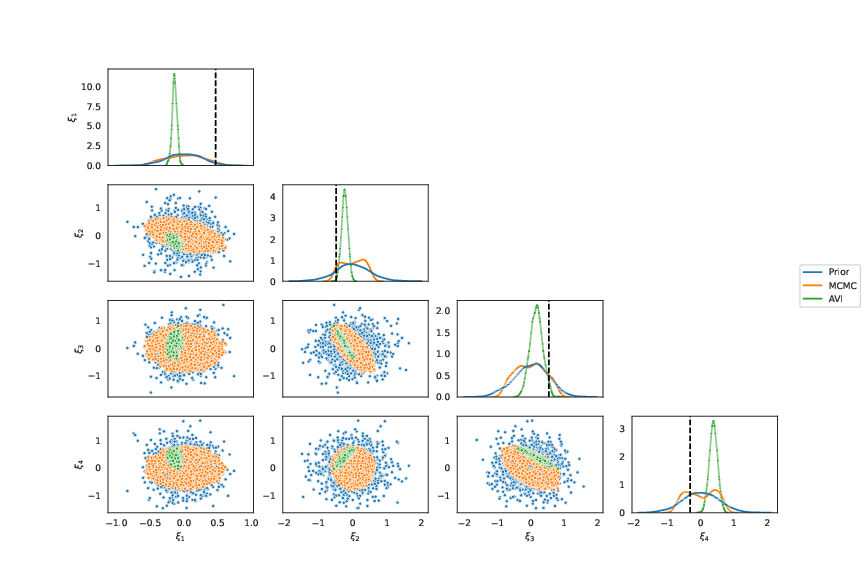

******************************************************************************************
99
Groundtruth:
 xi_data=[[-0.00283307  0.01772168 -1.0299947  -0.78471243]],
 y_data=[[ 0.5401156 -1.3961445]]


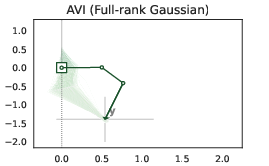

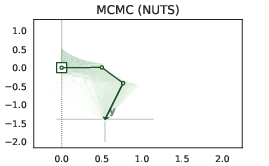

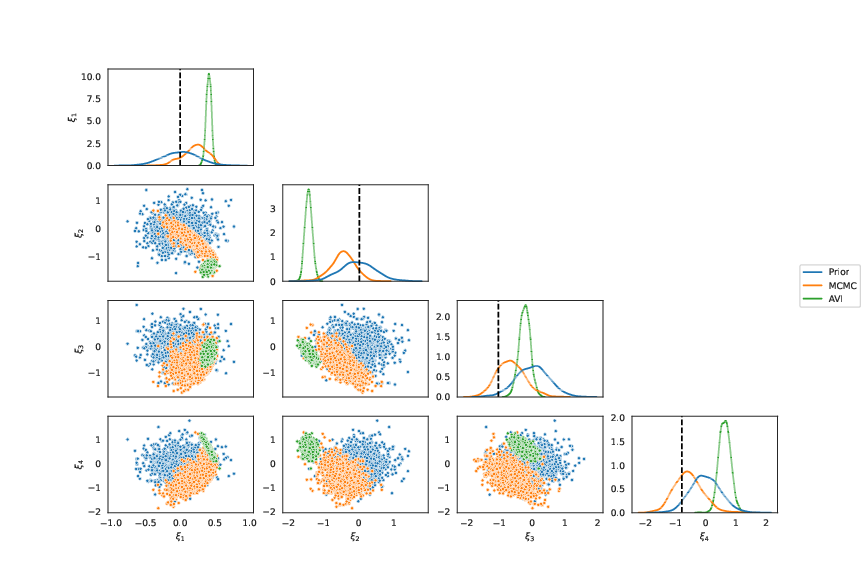

******************************************************************************************


In [4]:
xi_data_, y_data_ = torch.load(results_dir +'xi_data.pt'), torch.load(results_dir +'y_data.pt')

for j in range(100):
    print(j) 
    
    # Getting data
    xi_data, y_data = xi_data_[j].reshape(1,-1), y_data_[j].reshape(1,-1)
    print('Groundtruth:\n xi_data='+str(xi_data.data.numpy())+',\n y_data='+str(y_data.data.numpy()))
    
    display(WImage(filename=results_dir +str(j)+'_AVI'+'_plot.pdf'))
    display(WImage(filename=results_dir +str(j)+'_MCMC'+'_plot.pdf'))
    display(WImage(filename=results_dir +str(j)+'_pairplot.pdf'))
    print('*'*90) 